In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, AgglomerativeClustering
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

from sklearn.preprocessing import label_binarize

from plotly.offline import init_notebook_mode
init_notebook_mode(connected=True)

In [2]:
# Load the dataset
data = pd.read_csv("/marketing_campaign.csv")

In [3]:
data.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,9/4/2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,3/8/2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,8/21/2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,2/10/2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,1/19/2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [4]:
print(f"Informations Of The Dataset :\n")
print(data.info())

Informations Of The Dataset :

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDeal

In [9]:
# Summary statistics
print(data.describe())

                 ID   Year_Birth         Income      Kidhome     Teenhome  \
count   2240.000000  2240.000000    2216.000000  2240.000000  2240.000000   
mean    5592.159821  1968.805804   51633.638134     0.444196     0.506250   
std     3246.662198    11.984069   20675.937048     0.538398     0.544538   
min        0.000000  1893.000000    1730.000000     0.000000     0.000000   
25%     2828.250000  1959.000000   35303.000000     0.000000     0.000000   
50%     5458.500000  1970.000000   51381.500000     0.000000     0.000000   
75%     8427.750000  1977.000000   68179.500000     1.000000     1.000000   
max    11191.000000  1996.000000  113734.000000     2.000000     2.000000   

           Recency     MntWines    MntFruits  MntMeatProducts  \
count  2240.000000  2240.000000  2240.000000      2240.000000   
mean     49.109375   303.935714    26.302232       166.950000   
std      28.962453   336.597393    39.773434       225.715373   
min       0.000000     0.000000     0.000000  

In [10]:
print(f"Summary Of The Dataset :")
data.describe().style.set_properties(**{"background-color": "#682F2F","color":"#e9c46a","border": "1.5px solid black"})

Summary Of The Dataset :


,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000
mean,5592.159821,1968.805804,51633.638134,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,27.062946,44.021875,2.325000,4.084821,2.662054,5.790179,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.000000,11.000000,0.149107
std,3246.662198,11.984069,20675.937048,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,41.280498,52.167439,1.932238,2.778714,2.923101,3.250958,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.000000,0.000000,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,1.000000,9.000000,1.000000,2.000000,0.000000,3.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,8.000000,24.000000,2.000000,4.000000,2.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.000000
75%,8427.750000,1977.000000,68179.500000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,33.000000,56.000000,3.000000,6.000000,4.000000,8.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,11.000000,0.000000
max,11191.000000,1996.000000,113734.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,263.000000,362.000000,15.000000,27.000000,28.000000,13.000000,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.000000,11.000000,1.000000


In [11]:
missing_values_count = data['Income'].isnull().sum()

print(f"Count of missing values in 'Income' column: {missing_values_count}")

Count of missing values in 'Income' column: 24


In [12]:
# Replace missing income values with the mean income
mean_income = data['Income'].mean()
data['Income'].fillna(mean_income, inplace=True)

In [13]:
#re-check the missing values for Income
data['Income'].isna().sum()

0

In [14]:
data["Dt_Customer"] = pd.to_datetime(data["Dt_Customer"])
dates = []
for i in data["Dt_Customer"]:
    i = i.date()
    dates.append(i)

print(f"Newest customer's enrolment date is {max(dates)}")
print(f"Oldest customer's enrolment date is {min(dates)}")

Newest customer's enrolment date is 2014-06-29
Oldest customer's enrolment date is 2012-07-30


In [5]:
# Calculate the quartiles and IQR for 'Income'
Q1 = data['Income'].quantile(0.25)
Q3 = data['Income'].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds for potential outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify potential outliers
potential_outliers = data[(data['Income'] < lower_bound) | (data['Income'] > upper_bound)]

# Print the potential outliers
print("Potential Outliers:")
print(potential_outliers)

Potential Outliers:
         ID  Year_Birth   Education Marital_Status    Income  Kidhome  \
164    8475        1973         PhD        Married  157243.0        0   
617    1503        1976         PhD       Together  162397.0        1   
655    5555        1975  Graduation       Divorced  153924.0        0   
687    1501        1982         PhD        Married  160803.0        0   
1300   5336        1971      Master       Together  157733.0        1   
1653   4931        1977  Graduation       Together  157146.0        0   
2132  11181        1949         PhD        Married  156924.0        0   
2233   9432        1977  Graduation       Together  666666.0        1   

      Teenhome Dt_Customer  Recency  MntWines  ...  NumWebVisitsMonth  \
164          1    3/1/2014       98        20  ...                  0   
617          1    6/3/2013       31        85  ...                  1   
655          0    2/7/2014       81         1  ...                  0   
687          0    8/4/2012    

In [6]:
# Replace income values outside the bounds with the average income
average_income = data[(data['Income'] >= lower_bound) & (data['Income'] <= upper_bound)]['Income'].mean()
data.loc[data['Income'] < lower_bound, 'Income'] = average_income
data.loc[data['Income'] > upper_bound, 'Income'] = average_income

In [15]:
days = []
newest = max(dates)
for i in dates:
    duration = newest - i
    days.append(duration)
data["Customer Loyalty"] = days
data["Customer Loyalty"] = data["Customer Loyalty"].dt.days
data["Age"] = 2015 - data["Year_Birth"]
data["Spent"] = data["MntWines"] + data["MntFruits"] + data["MntMeatProducts"] + data["MntFishProducts"] + data["MntSweetProducts"] + data["MntGoldProds"]
data["Children"] = data["Kidhome"] + data["Teenhome"]
data["Parental Status"] = np.where(data["Children"] > 0, 1, 0)
data["Marital_Status"].replace({"Married":"Couple", "Together":"Couple", "Absurd":"Alone", "Widow":"Alone", "YOLO":"Alone", "Divorced":"Alone", "Single":"Alone"}, inplace = True)
data["Education"].replace({"Basic":"Undergraduate","2n Cycle":"Undergraduate", "Graduation":"Graduate", "Master":"Postgraduate", "PhD":"Postgraduate"}, inplace = True)
data["Total Promo"] =  data["AcceptedCmp1"]+ data["AcceptedCmp2"]+ data["AcceptedCmp3"]+ data["AcceptedCmp4"]+ data["AcceptedCmp5"]
data.rename(columns={"Marital_Status": "Marital Status","MntWines": "Wines","MntFruits":"Fruits","MntMeatProducts":"Meat","MntFishProducts":"Fish","MntSweetProducts":"Sweets","MntGoldProds":"Gold","NumWebPurchases": "Web","NumCatalogPurchases":"Catalog","NumStorePurchases":"Store","NumDealsPurchases":"Discount Purchases"}, inplace = True)
data = data[["ID","Age","Education","Marital Status","Parental Status","Children","Kidhome","Teenhome","Income","Spent","Customer Loyalty","Recency","Wines","Fruits","Meat","Fish","Sweets","Gold","Web","Catalog","Store","Discount Purchases","Total Promo","NumWebVisitsMonth"]]

data = data[data["Age"] < 90]
data = data[data["Income"] < 600000]



In [16]:
# Calculate the average age of non-outliers
average_age = data[(data['Age'] >= lower_bound) & (data['Age'] <= upper_bound)]['Age'].mean()

# Replace outliers with the average age
data.loc[data['Age'] < lower_bound, 'Age'] = average_age
data.loc[data['Age'] > upper_bound, 'Age'] = average_age

In [17]:
# Print the potential outliers
print("Potential Outliers:")
print(potential_outliers)

Potential Outliers:
         ID  Year_Birth   Education Marital_Status    Income  Kidhome  \
164    8475        1973         PhD        Married  157243.0        0   
617    1503        1976         PhD       Together  162397.0        1   
655    5555        1975  Graduation       Divorced  153924.0        0   
687    1501        1982         PhD        Married  160803.0        0   
1300   5336        1971      Master       Together  157733.0        1   
1653   4931        1977  Graduation       Together  157146.0        0   
2132  11181        1949         PhD        Married  156924.0        0   
2233   9432        1977  Graduation       Together  666666.0        1   

      Teenhome Dt_Customer  Recency  MntWines  ...  NumWebVisitsMonth  \
164          1    3/1/2014       98        20  ...                  0   
617          1    6/3/2013       31        85  ...                  1   
655          0    2/7/2014       81         1  ...                  0   
687          0    8/4/2012    

In [18]:
# Calculate the average age of non-outliers
average_age = data[(data['Age'] >= lower_bound) & (data['Age'] <= upper_bound)]['Age'].mean()

# Replace outliers with the average age
data.loc[data['Age'] < lower_bound, 'Age'] = average_age
data.loc[data['Age'] > upper_bound, 'Age'] = average_age

In [ ]:
print("After preprocessing, let's have a glimpse of the final dataset :")
data.head().style.set_properties(**{"background-color": "#682F2F","color":"#e9c46a","border": "1.5px solid black"})

After preprocessing, let's have a glimpse of the final dataset :


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.000000,0,0,2012-09-04 00:00:00,58,635,88,546,172,88,88,3,8,10,4,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.000000,1,1,2014-03-08 00:00:00,38,11,1,6,2,1,6,2,1,1,2,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.000000,0,0,2013-08-21 00:00:00,26,426,49,127,111,21,42,1,8,2,10,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.000000,1,0,2014-02-10 00:00:00,26,11,4,20,10,3,5,2,2,0,4,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.000000,1,0,2014-01-19 00:00:00,94,173,43,118,46,27,15,5,5,3,6,5,0,0,0,0,0,0,3,11,0


In [22]:
print(f"After preprocessing, let's have a look on the summary of the dataset :")
data.describe().T.style.set_properties(**{"background-color": "#682F2F","color":"#e9c46a","border": "1.5px solid black"})

After preprocessing, let's have a look on the summary of the dataset :


,count,mean,std,min,25%,50%,75%,max
ID,2237.000000,5590.726419,3245.118591,0.000000,2829.000000,5455.000000,8427.000000,11191.000000
Age,2237.000000,46.098346,11.701917,19.000000,38.000000,45.000000,56.000000,75.000000
Parental Status,2237.000000,0.715244,0.451399,0.000000,0.000000,1.000000,1.000000,1.000000
Children,2237.000000,0.950827,0.752037,0.000000,0.000000,1.000000,1.000000,3.000000
Kidhome,2237.000000,0.444345,0.538467,0.000000,0.000000,0.000000,1.000000,2.000000
Teenhome,2237.000000,0.506482,0.544593,0.000000,0.000000,0.000000,1.000000,2.000000
Income,2237.000000,51622.259911,20564.314630,1730.000000,35523.000000,51633.638134,68092.000000,113734.000000
Spent,2237.000000,605.743406,601.840466,5.000000,69.000000,396.000000,1045.000000,2525.000000
Customer Loyalty,2237.000000,353.790344,202.137961,0.000000,181.000000,356.000000,529.000000,699.000000
Recency,2237.000000,49.104604,28.956073,0.000000,24.000000,49.000000,74.000000,99.000000


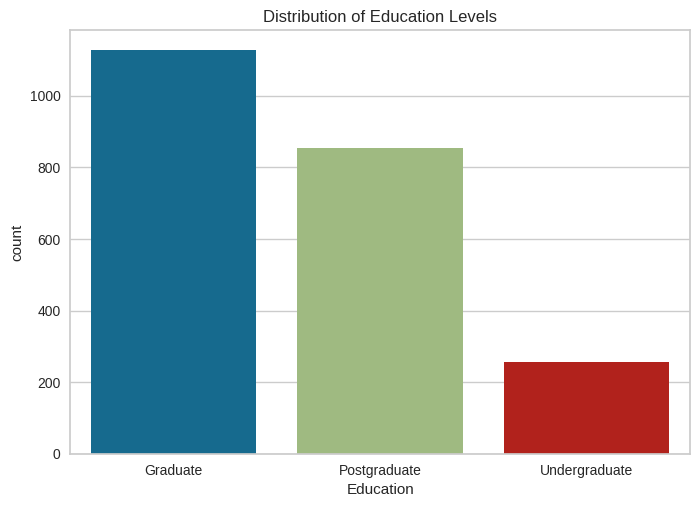

In [33]:
# Distribution of Education
sns.countplot(data=data, x='Education')
plt.title('Distribution of Education Levels')
plt.show()

<Axes: ylabel='Education'>

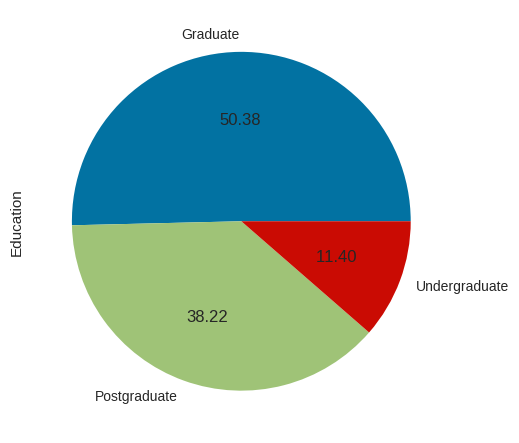

In [34]:
data['Education'].value_counts().plot(kind='pie',autopct='%.2f')

<Axes: ylabel='Marital Status'>

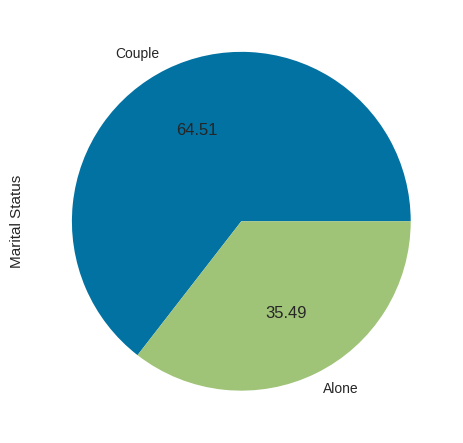

In [35]:
data['Marital Status'].value_counts().plot(kind='pie',autopct='%.2f')

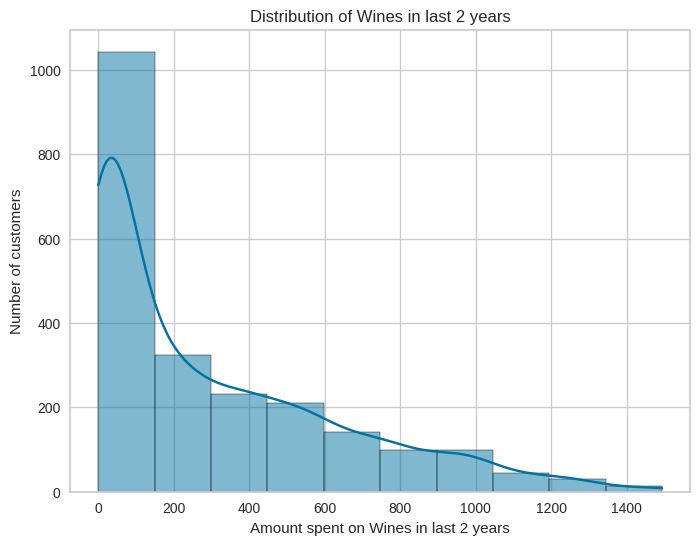

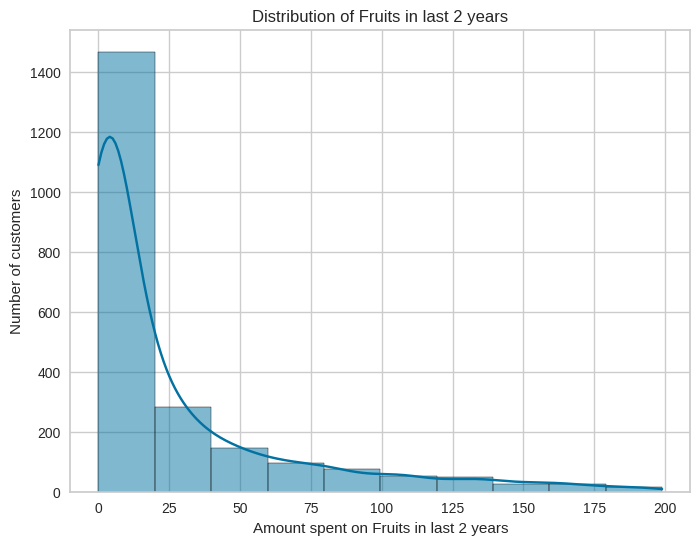

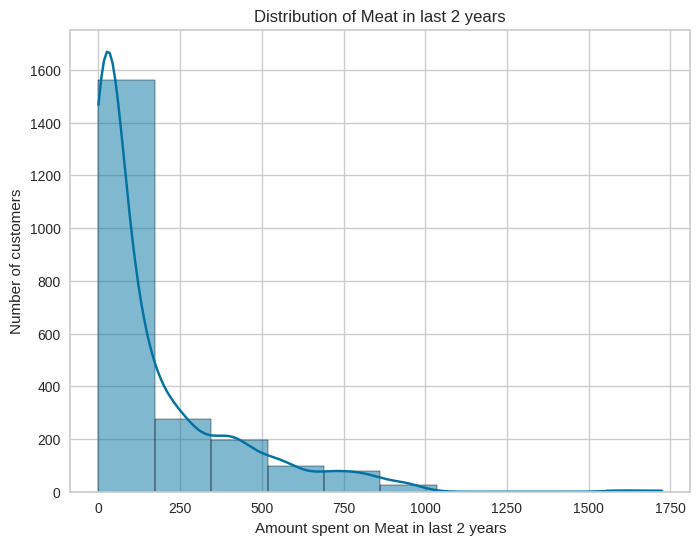

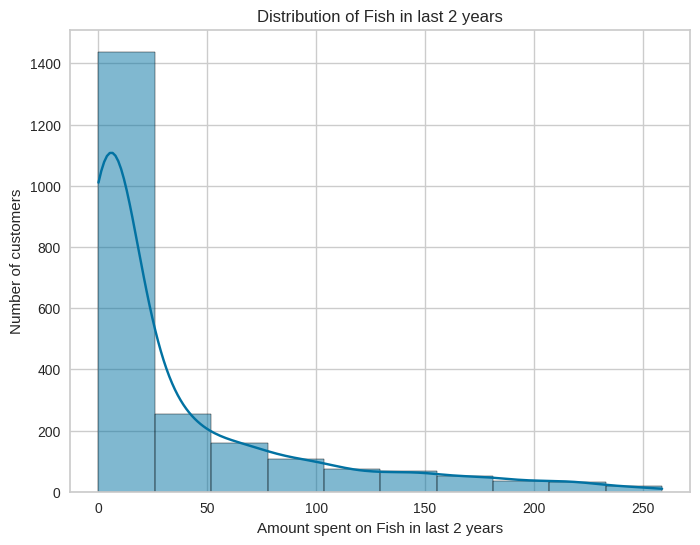

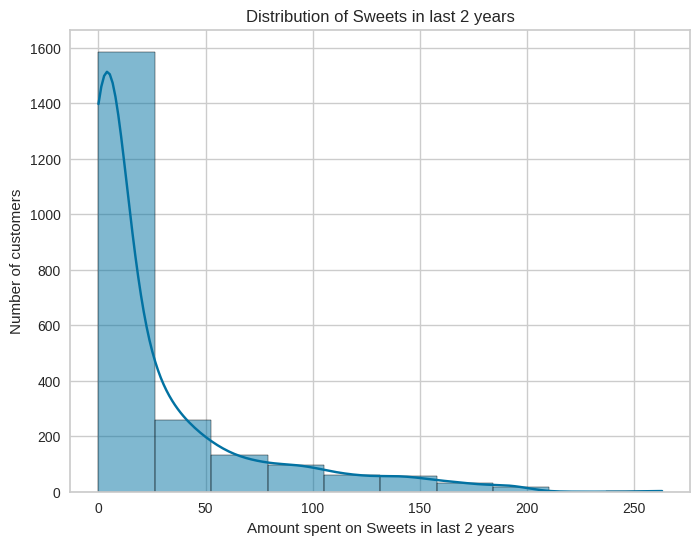

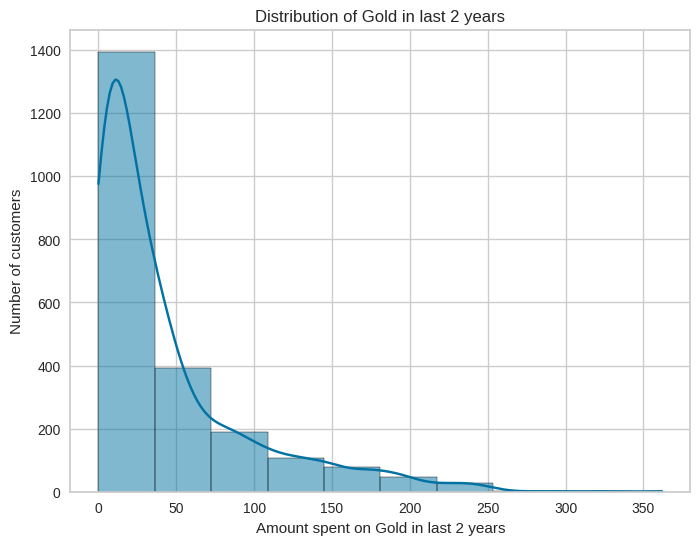

In [36]:
# Select the numerical variables related to "Products"
product_vars = ['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']

# Create histograms for each numerical variable
for var in product_vars:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=data, x=var, bins=10, kde=True)
    plt.title(f'Distribution of {var} in last 2 years')
    plt.xlabel(f'Amount spent on {var} in last 2 years')
    plt.ylabel('Number of customers')
    plt.show()

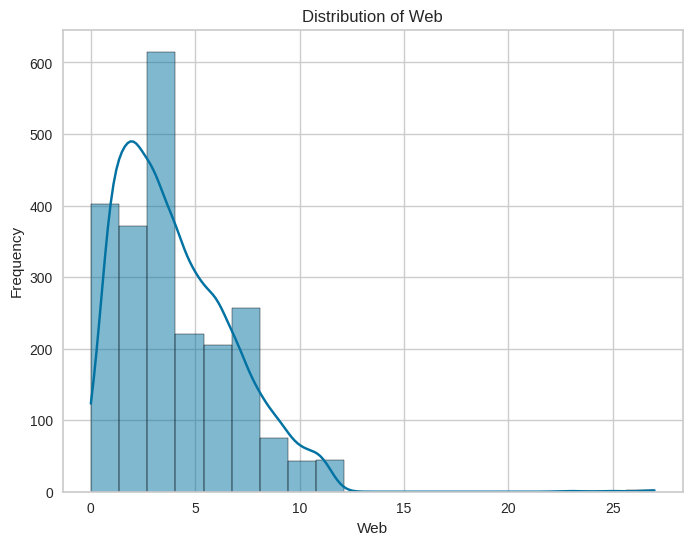

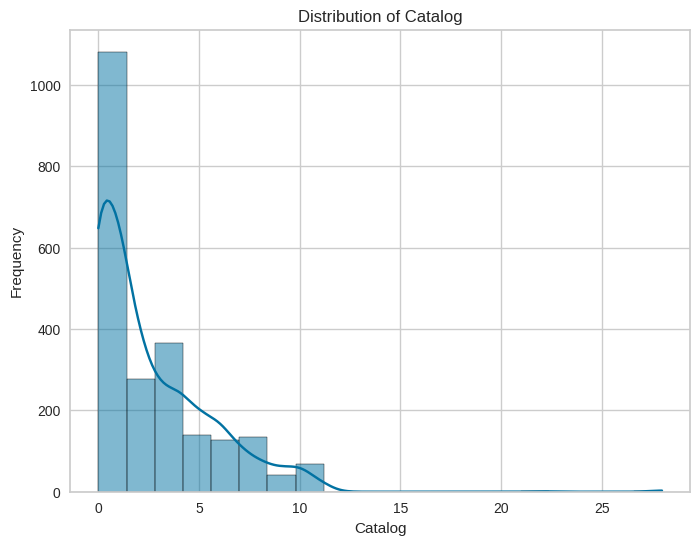

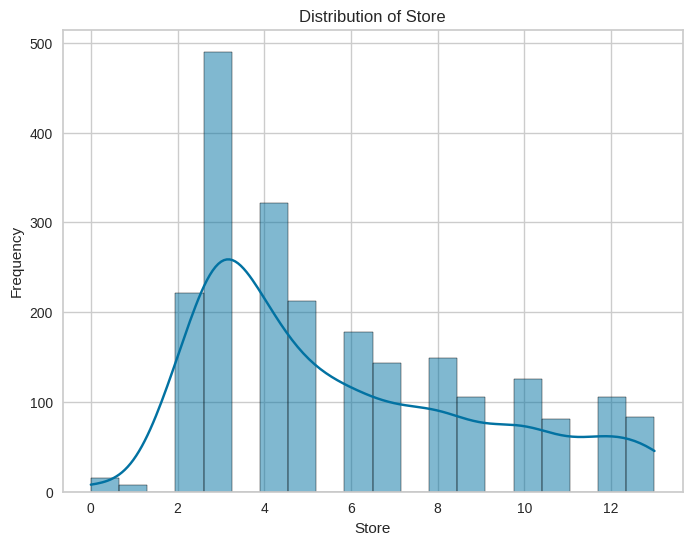

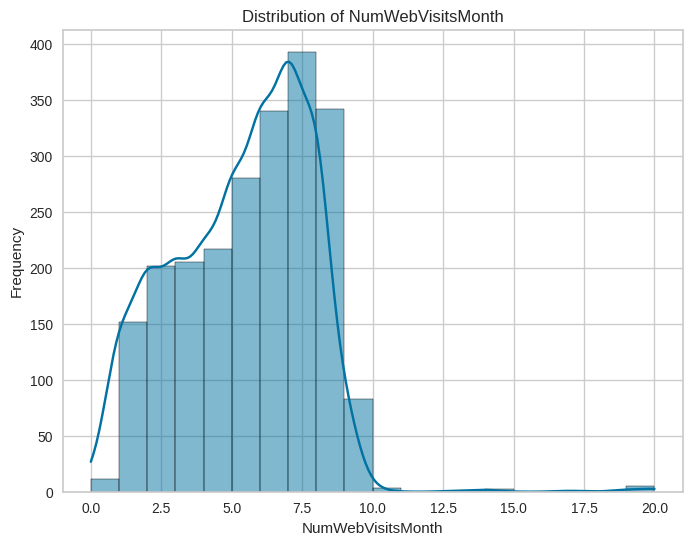

In [37]:
# Select the numerical variables related to "Place"
place_vars = ['Web', 'Catalog', 'Store', 'NumWebVisitsMonth']

# Create histograms for each numerical variable
for var in place_vars:
    plt.figure(figsize=(8, 6))
    sns.histplot(data=data, x=var, bins=20, kde=True)
    plt.title(f'Distribution of {var}')
    plt.xlabel(var)
    plt.ylabel('Frequency')
    plt.show()

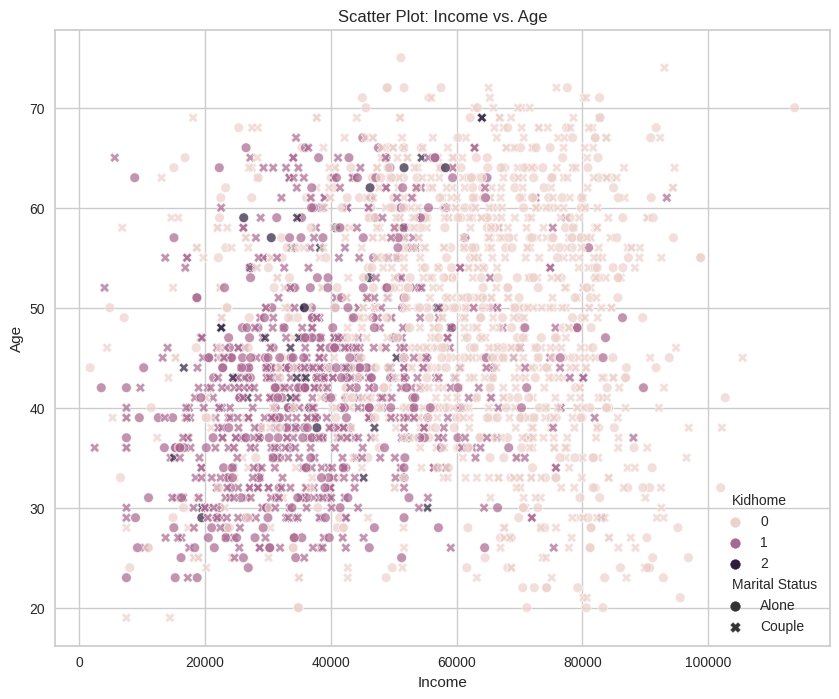

In [38]:
# Create a scatter plot between two numerical variables, for example, 'Income' and 'MntWines'

plt.figure(figsize=(10, 8))
sns.scatterplot(data=data, x='Income', y='Age',hue=data['Kidhome'],style=data['Marital Status'],alpha=0.7)
plt.title('Scatter Plot: Income vs. Age')
plt.xlabel('Income')
plt.ylabel('Age')
plt.show()

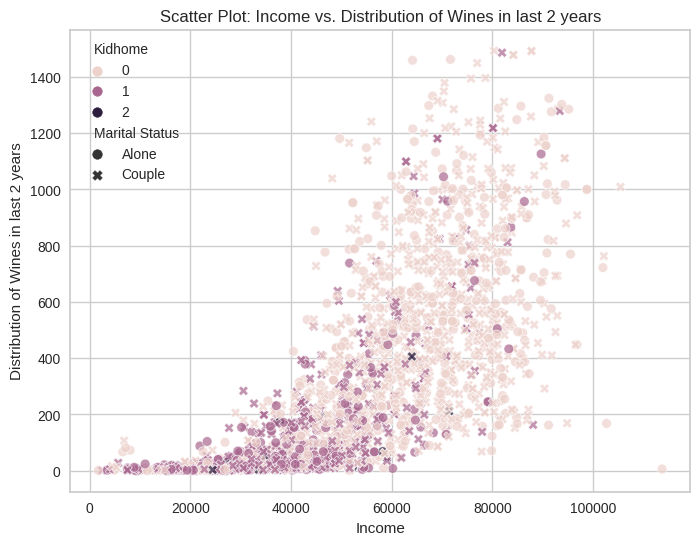

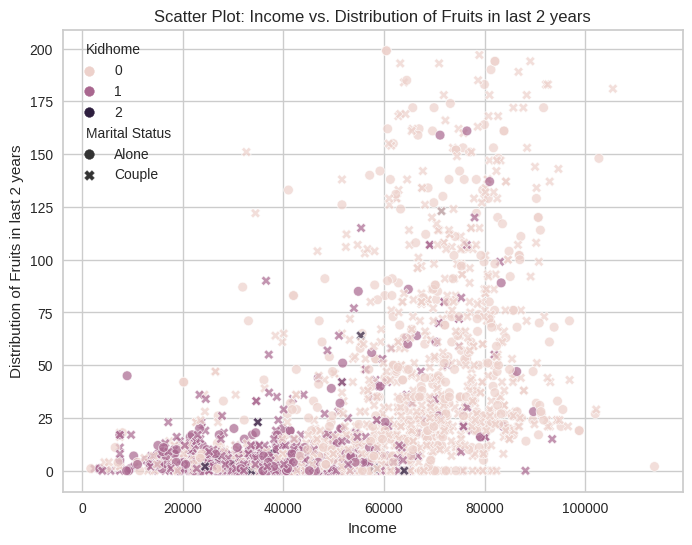

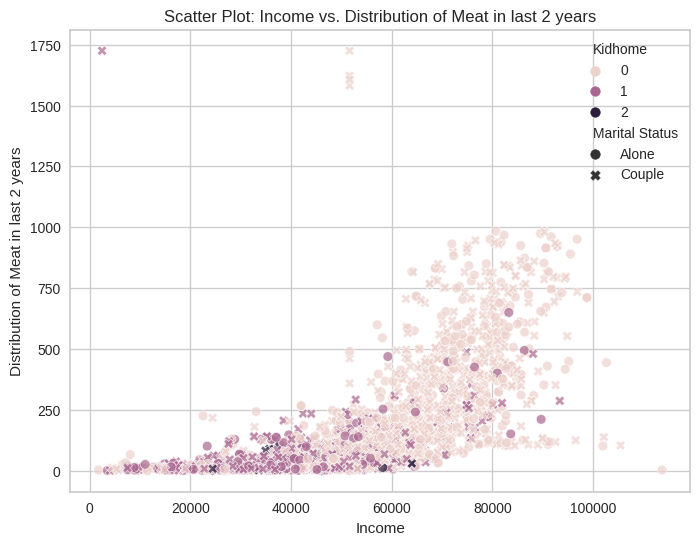

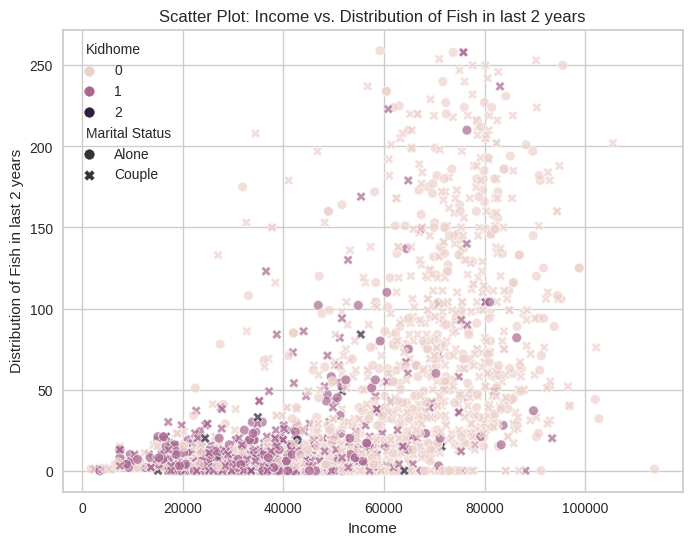

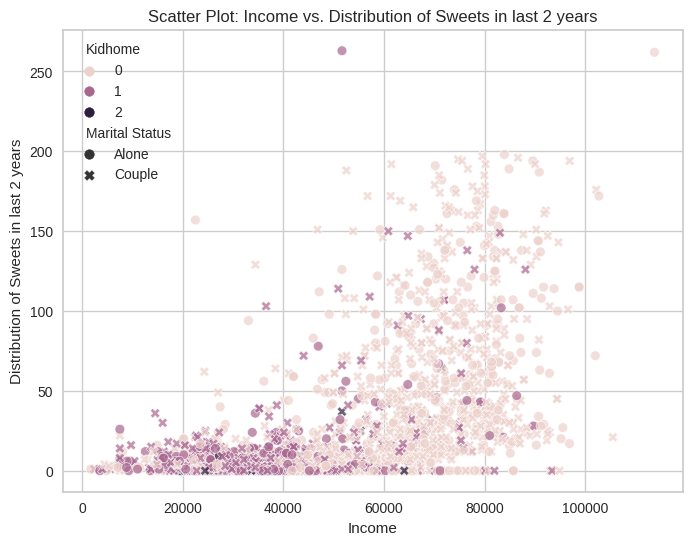

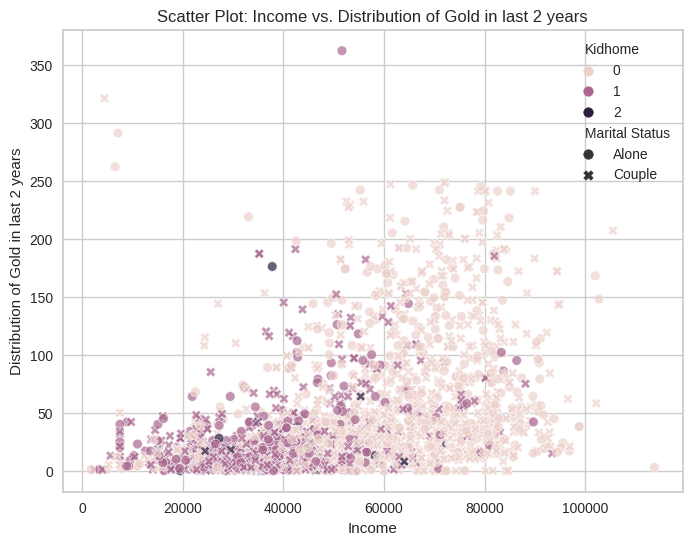

In [39]:
# Select the numerical variables related to "Products"
product_vars = ['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']

# Create Scatterplot for each numerical variable
for var in product_vars:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=data, x= 'Income',y=var,hue=data['Kidhome'],style=data['Marital Status'],alpha=0.7)

    plt.title(f'Scatter Plot: Income vs. Distribution of {var} in last 2 years')
    plt.xlabel(f'Income')
    plt.ylabel(f'Distribution of {var} in last 2 years')
    plt.show()

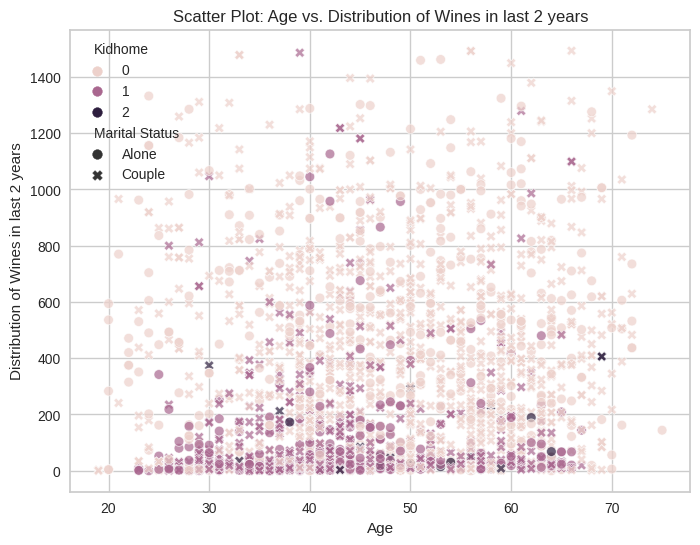

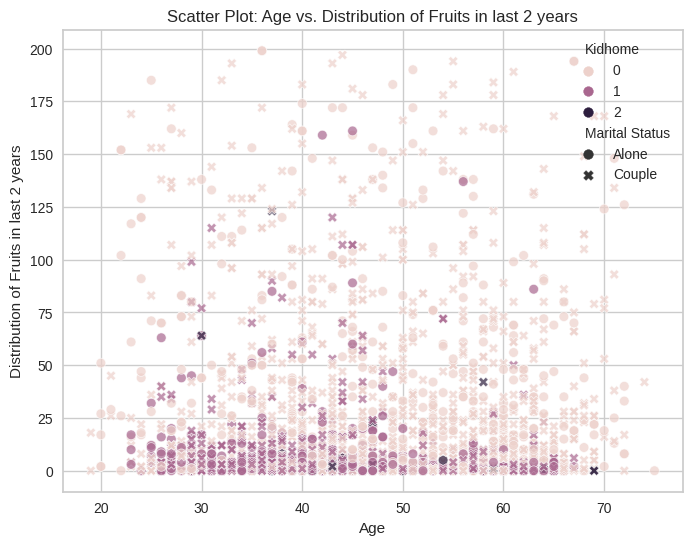

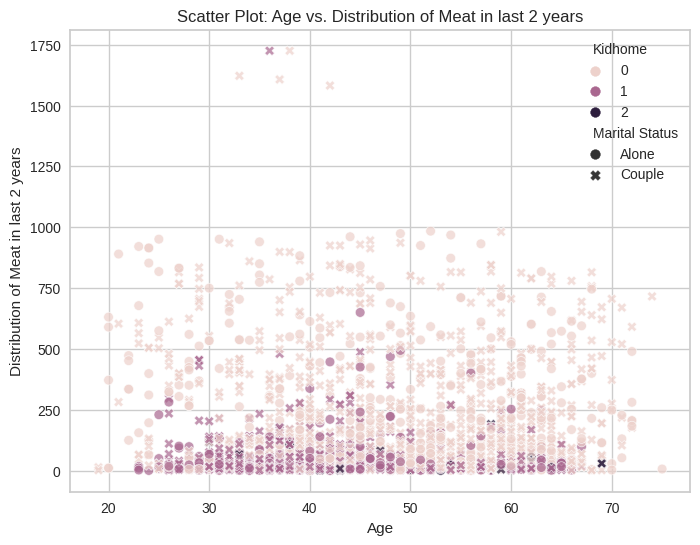

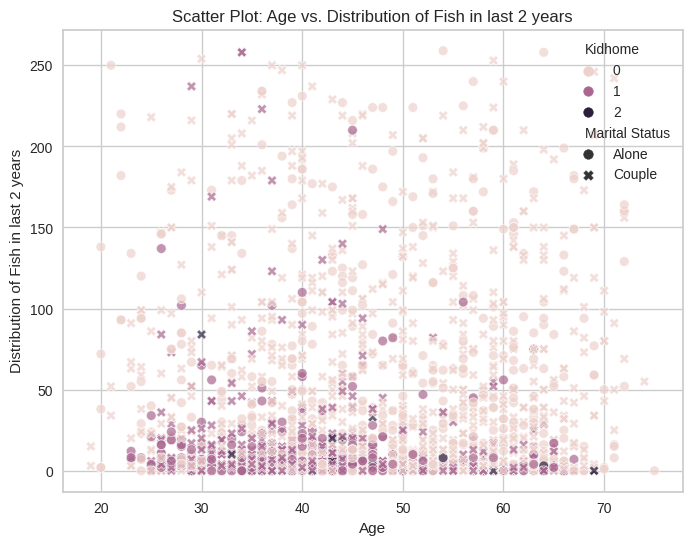

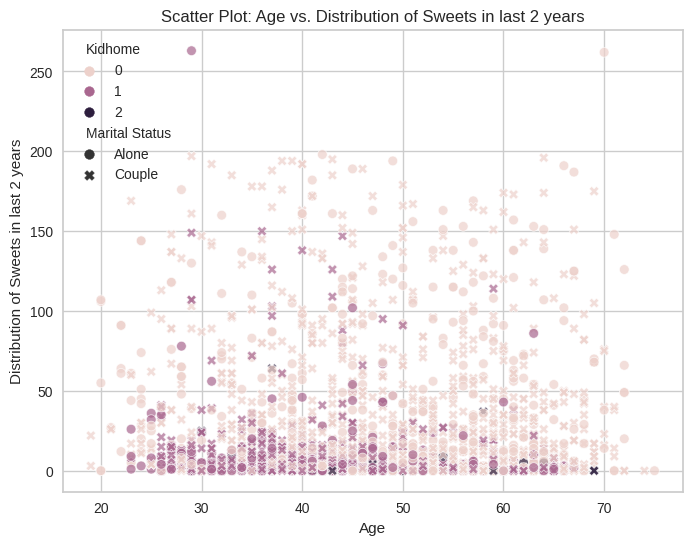

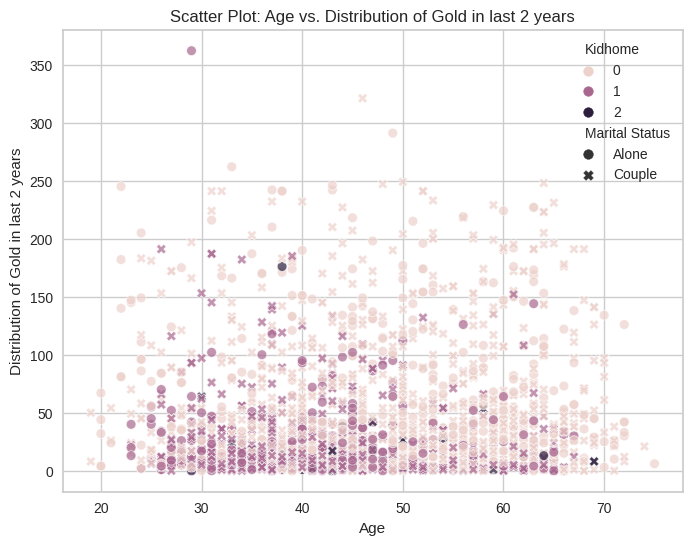

In [40]:
# Select the numerical variables related to "Products"
product_vars = ['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']

# Create Scatterplot for each numerical variable
for var in product_vars:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=data, x= 'Age',y=var,hue=data['Kidhome'],style=data['Marital Status'],alpha=0.7)

    plt.title(f'Scatter Plot: Age vs. Distribution of {var} in last 2 years')
    plt.xlabel(f'Age')
    plt.ylabel(f'Distribution of {var} in last 2 years')
    plt.show()

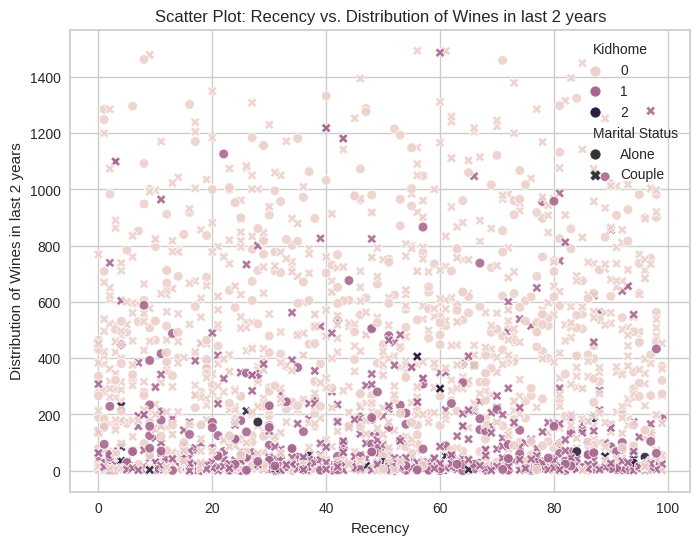

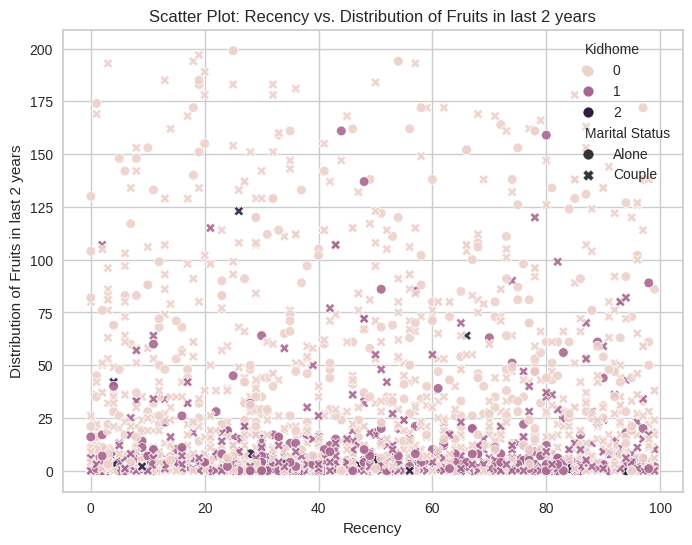

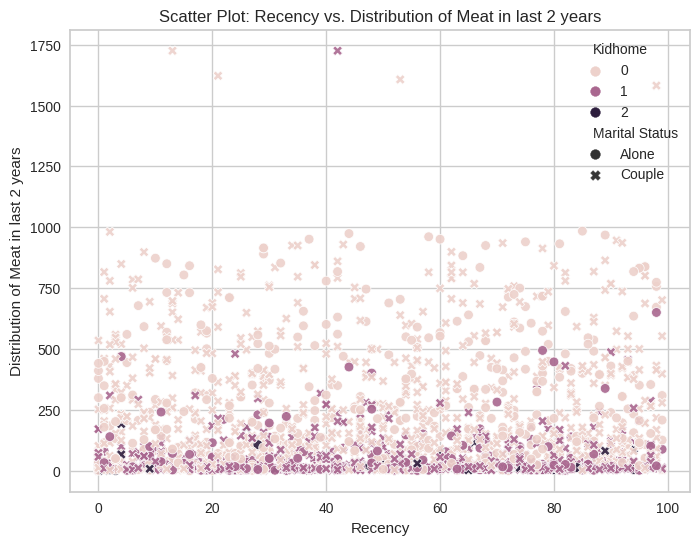

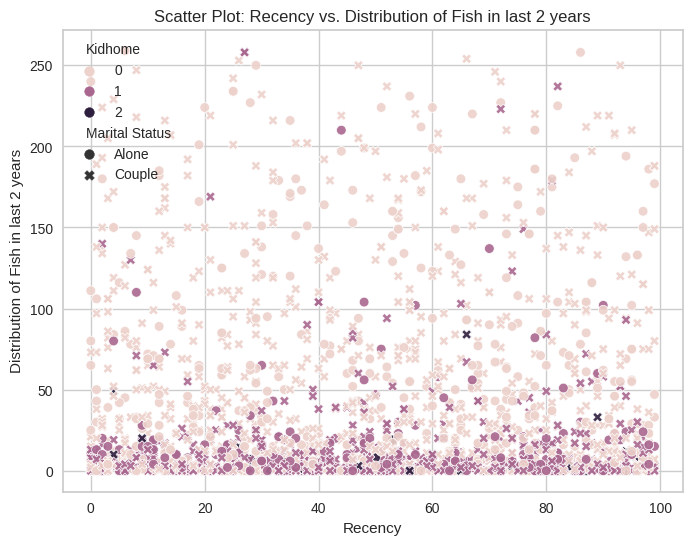

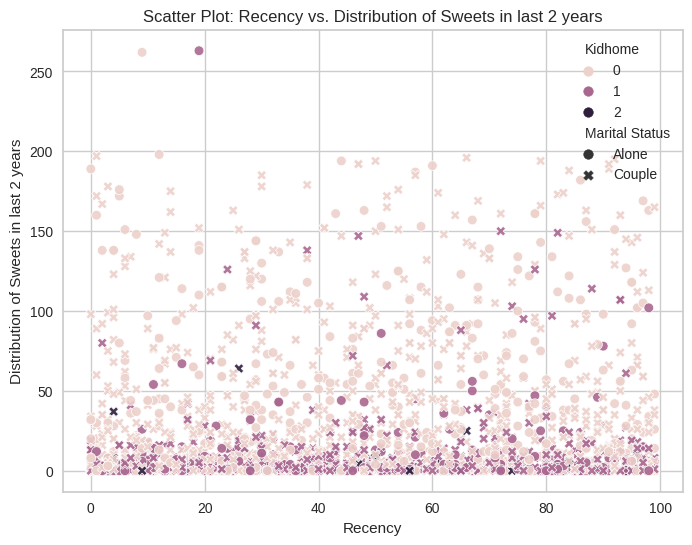

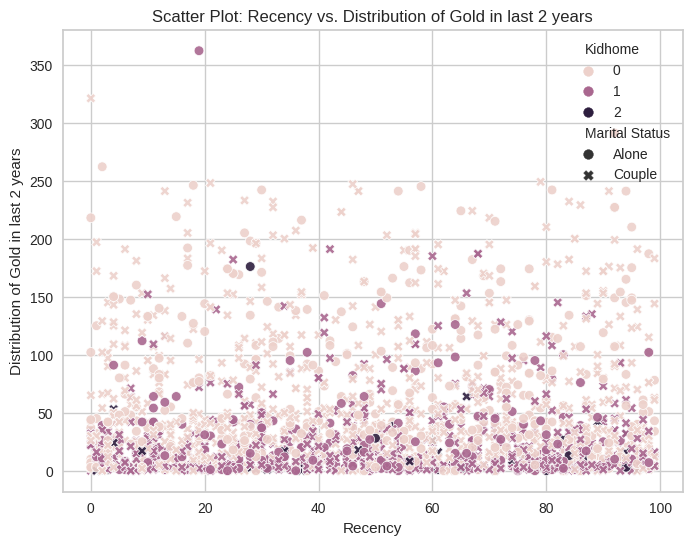

In [41]:
# Select the numerical variables related to "Products"
product_vars = ['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']

# Create Scatterplot for each numerical variable
for var in product_vars:
    plt.figure(figsize=(8, 6))
    sns.scatterplot(data=data, x= 'Recency',y=var,hue=data['Kidhome'],style=data['Marital Status'],alpha=0.9)

    plt.title(f'Scatter Plot: Recency vs. Distribution of {var} in last 2 years')
    plt.xlabel(f'Recency')
    plt.ylabel(f'Distribution of {var} in last 2 years')
    plt.show()

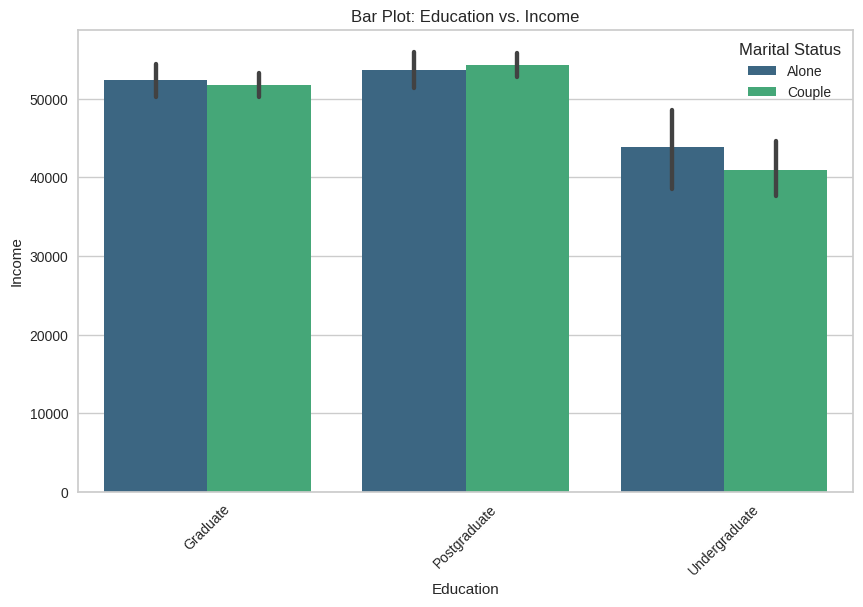

In [42]:
# Create a bar plot for 'Education' (categorical) vs. 'Income' (numerical)
plt.figure(figsize=(10, 6))
sns.barplot(data=data, x='Education', y='Income', palette='viridis',hue=data['Marital Status'])
plt.title('Bar Plot: Education vs. Income')
plt.xlabel('Education')
plt.ylabel('Income')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.show()

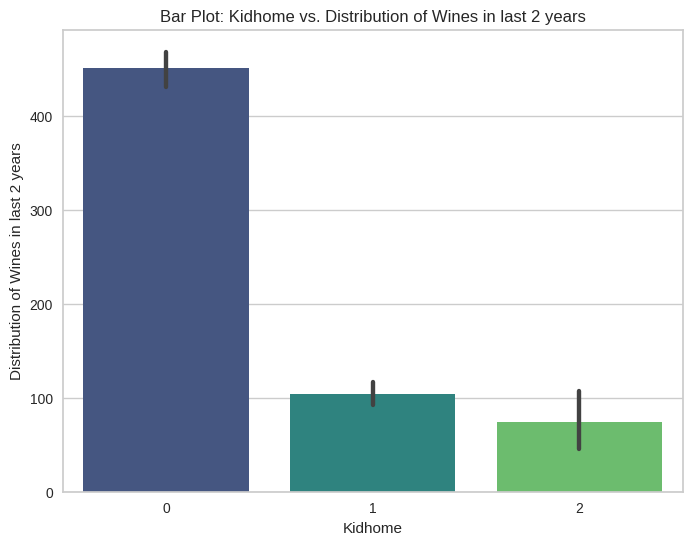

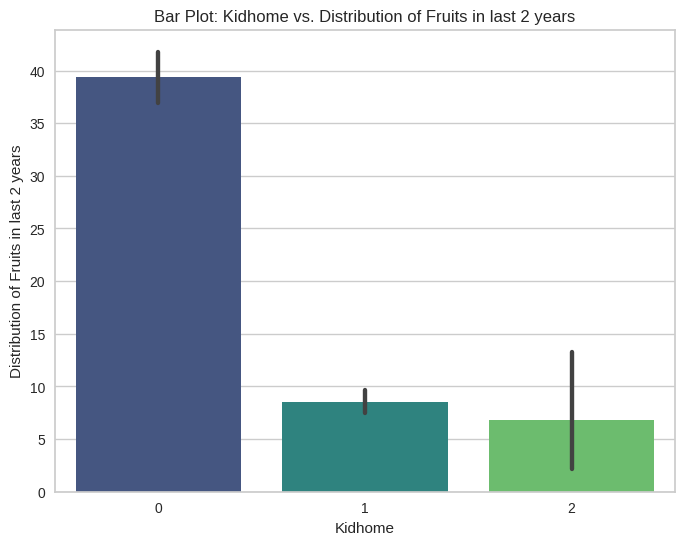

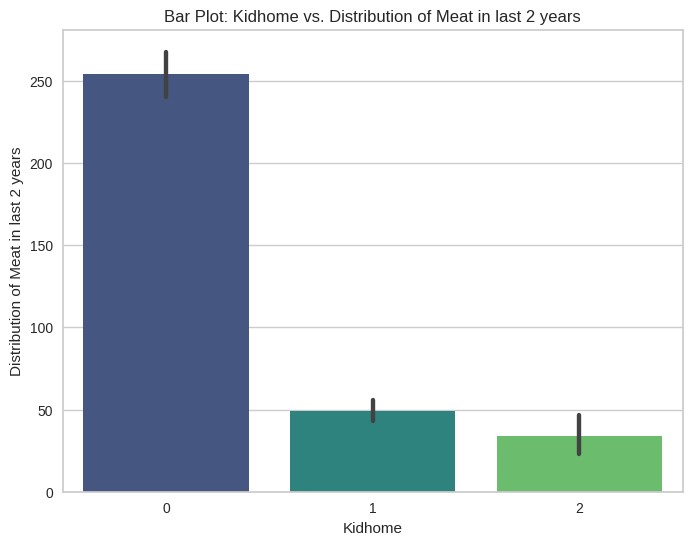

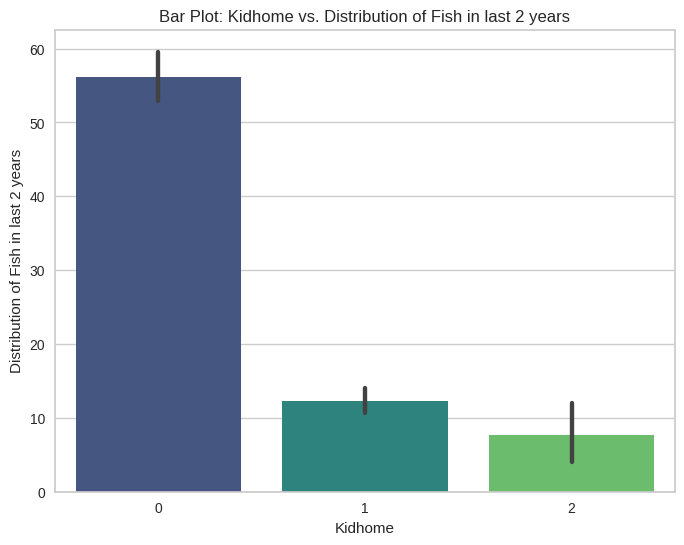

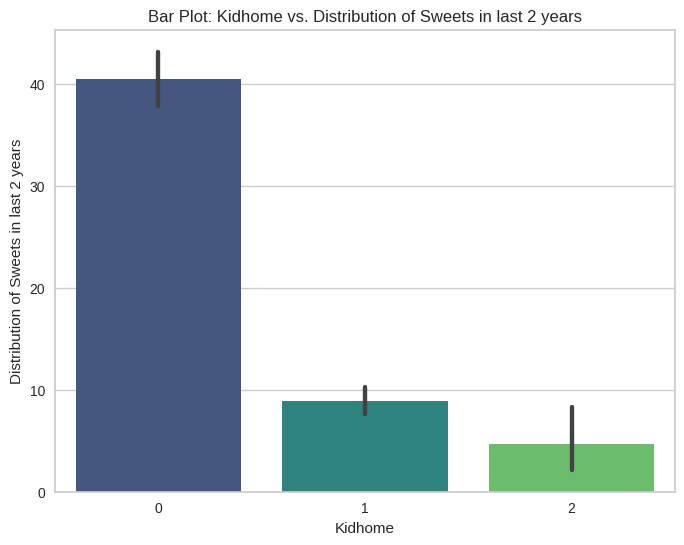

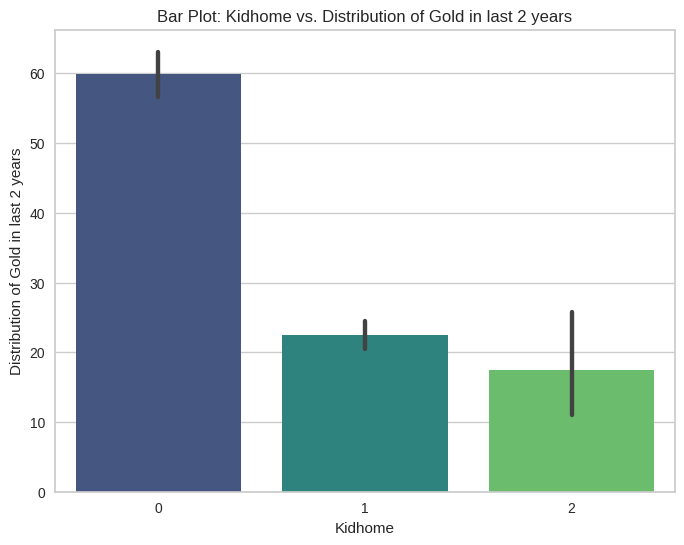

In [43]:
# Select the numerical variables related to "Products"
product_vars = ['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']

# Create Scatterplot for each numerical variable
for var in product_vars:
    plt.figure(figsize=(8, 6))
    sns.barplot(data=data, x='Kidhome', y= var, palette='viridis')

    plt.title(f'Bar Plot: Kidhome vs. Distribution of {var} in last 2 years')
    plt.xlabel(f'Kidhome')
    plt.ylabel(f'Distribution of {var} in last 2 years')
    plt.show()

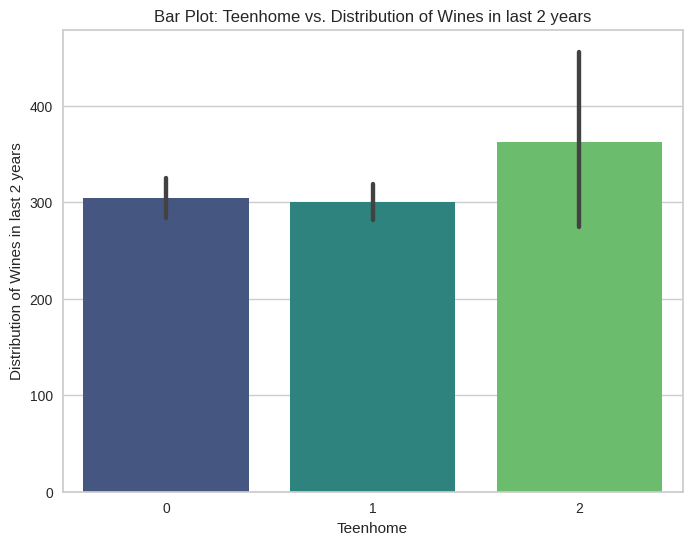

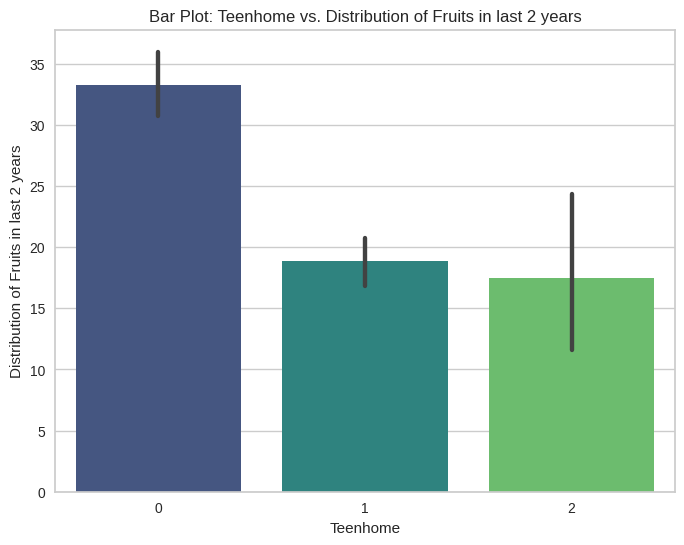

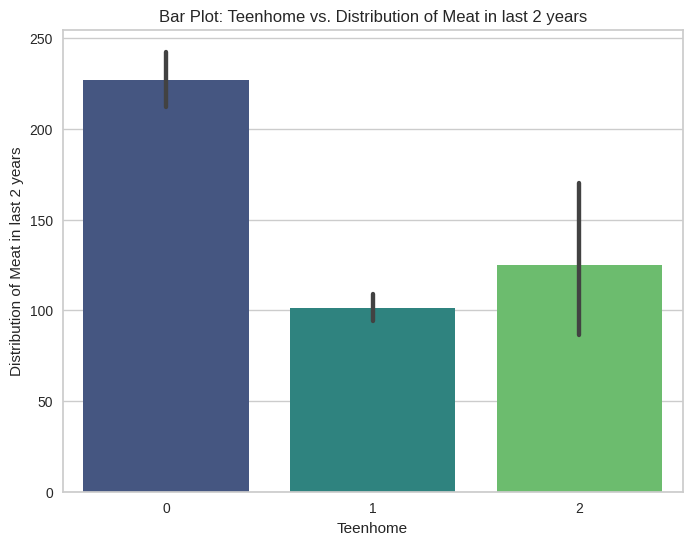

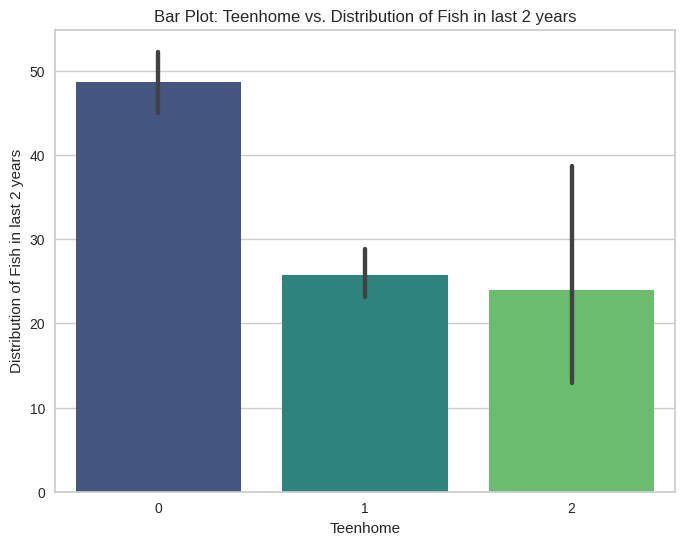

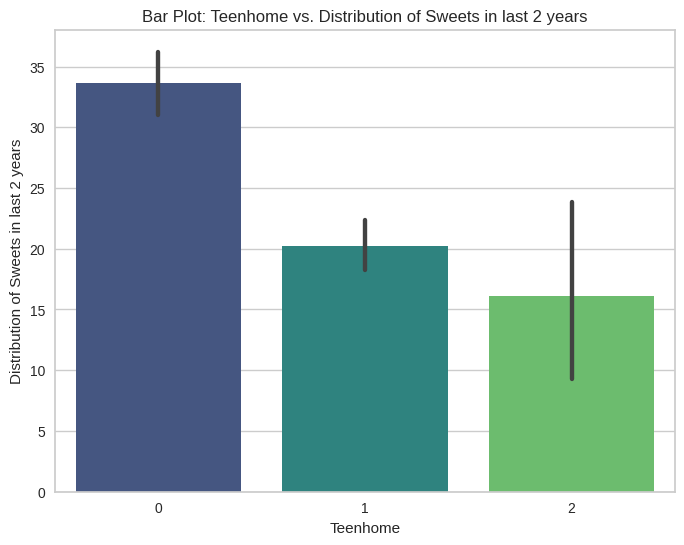

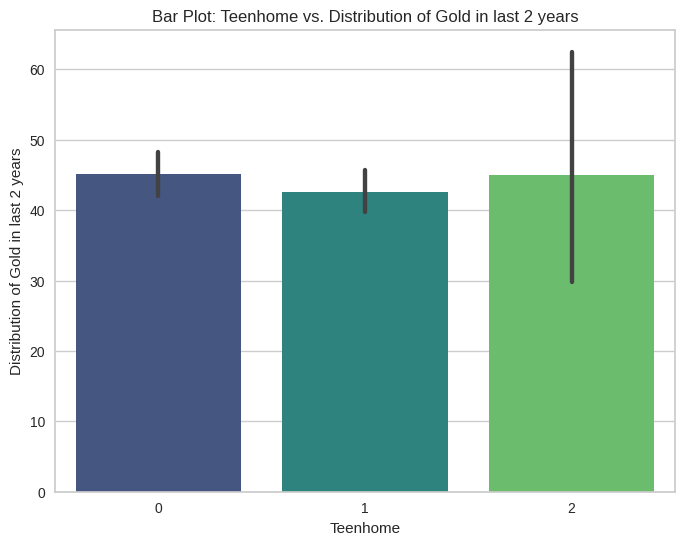

In [44]:
# Select the numerical variables related to "Products"
product_vars = ['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']

# Create Scatterplot for each numerical variable
for var in product_vars:
    plt.figure(figsize=(8, 6))
    sns.barplot(data=data, x='Teenhome', y= var, palette='viridis')

    plt.title(f'Bar Plot: Teenhome vs. Distribution of {var} in last 2 years')
    plt.xlabel(f'Teenhome')
    plt.ylabel(f'Distribution of {var} in last 2 years')
    plt.show()

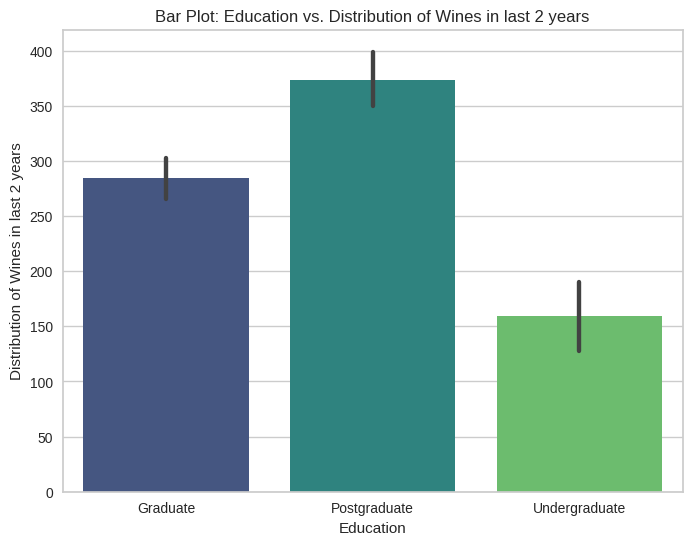

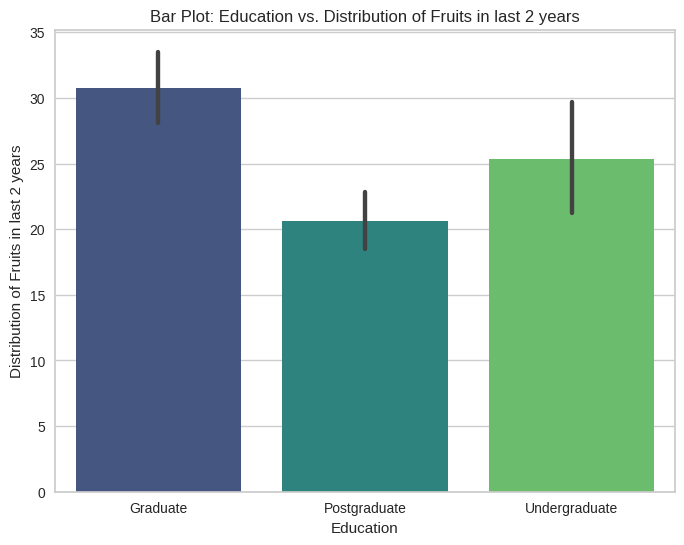

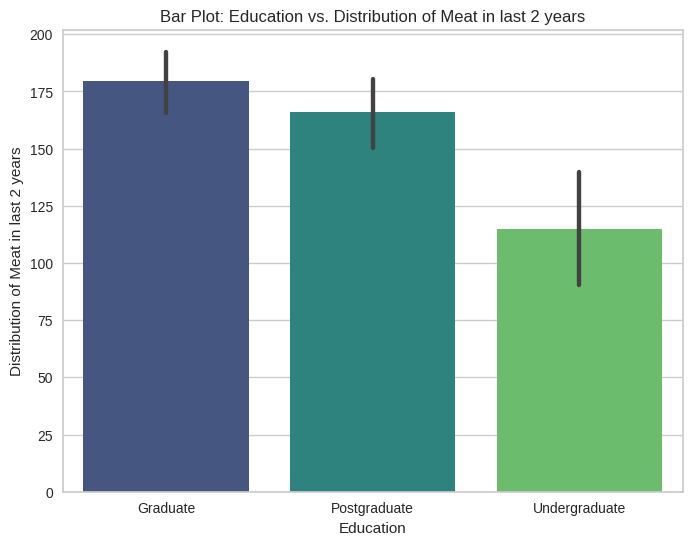

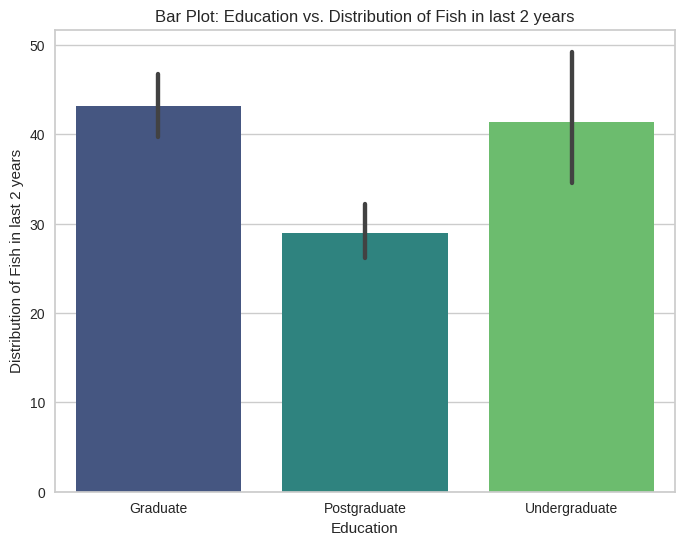

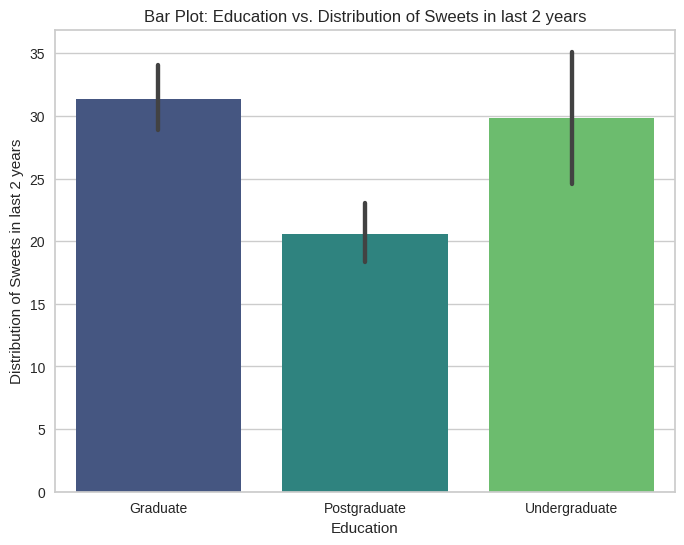

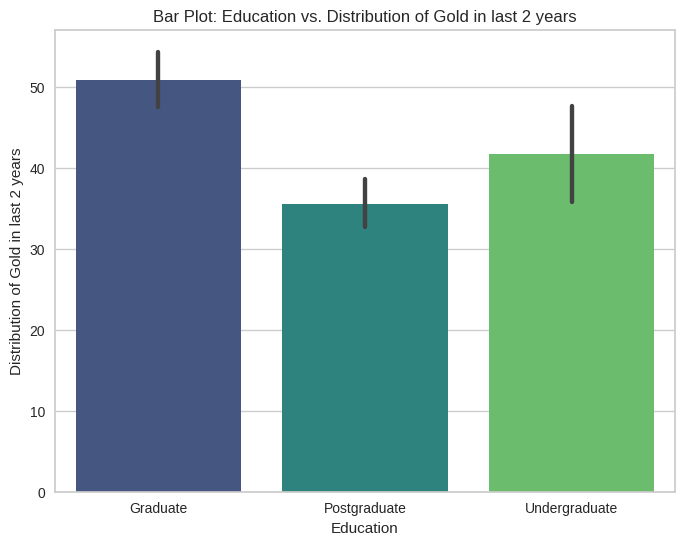

In [45]:
# Select the numerical variables related to "Products"
product_vars = ['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']

# Create Scatterplot for each numerical variable
for var in product_vars:
    plt.figure(figsize=(8, 6))
    sns.barplot(data=data, x='Education', y= var, palette='viridis')

    plt.title(f'Bar Plot: Education vs. Distribution of {var} in last 2 years')
    plt.xlabel(f'Education')
    plt.ylabel(f'Distribution of {var} in last 2 years')
    plt.show()

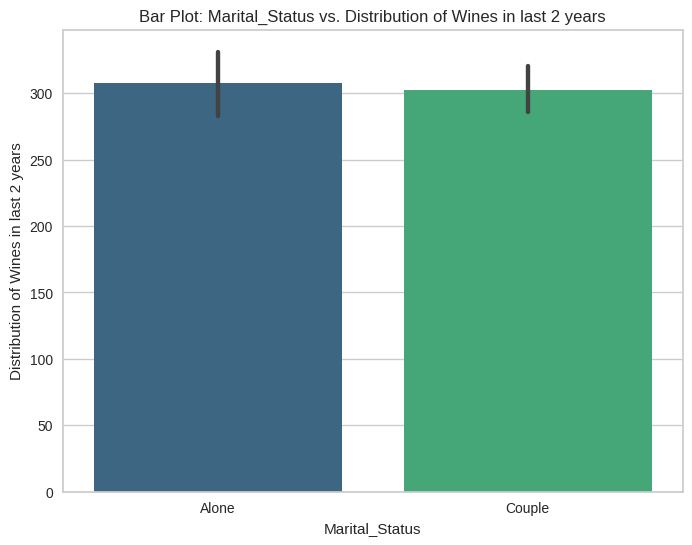

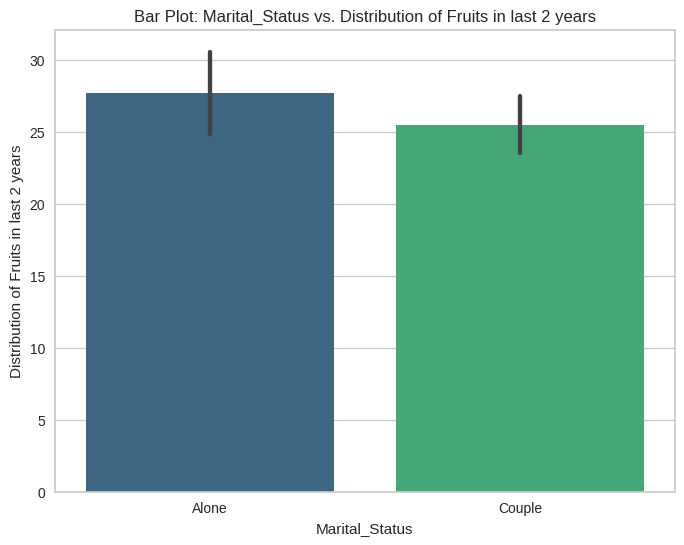

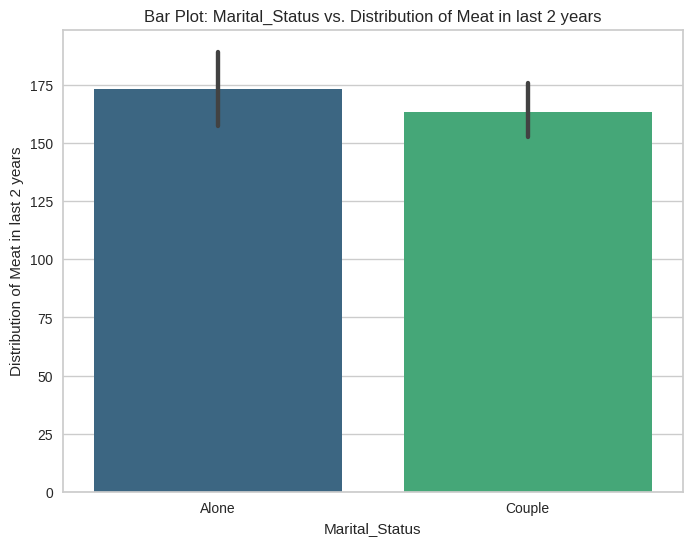

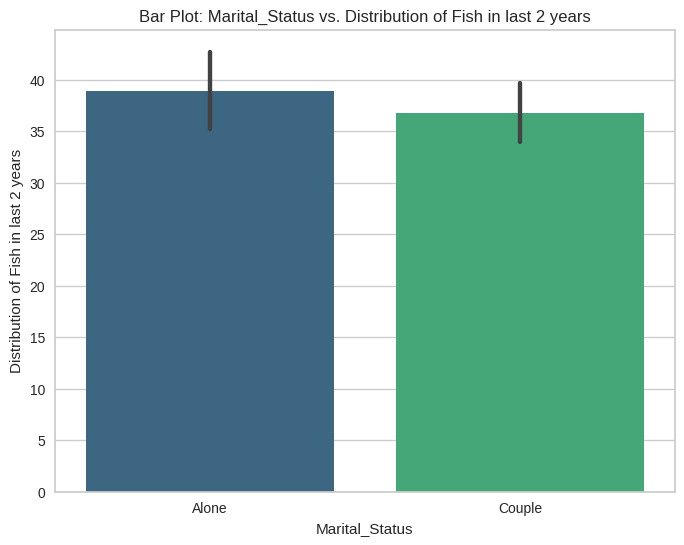

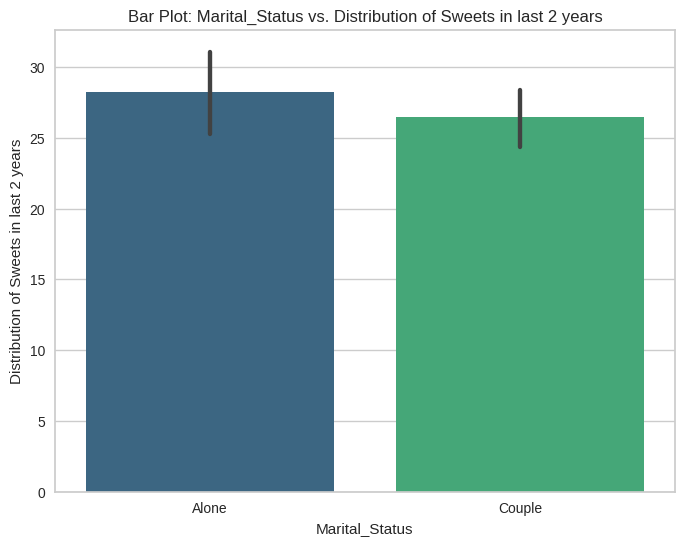

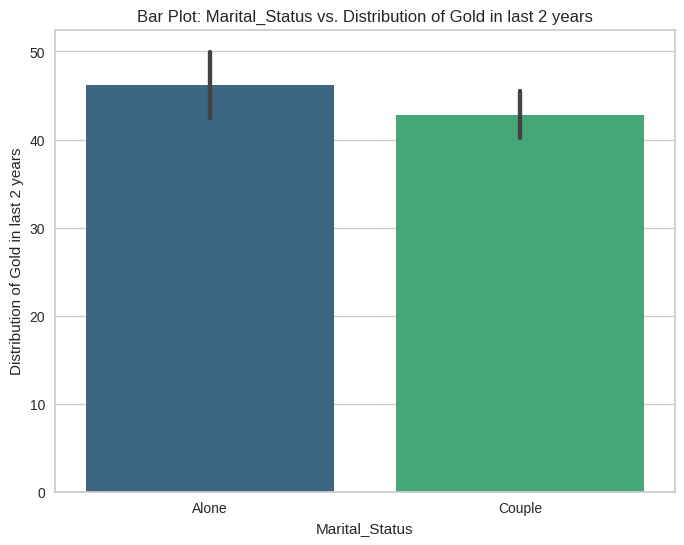

In [46]:
# Select the numerical variables related to "Products"
product_vars = ['Wines', 'Fruits', 'Meat', 'Fish', 'Sweets', 'Gold']

# Create Scatterplot for each numerical variable
for var in product_vars:
    plt.figure(figsize=(8, 6))
    sns.barplot(data=data, x='Marital Status', y= var, palette='viridis')

    plt.title(f'Bar Plot: Marital_Status vs. Distribution of {var} in last 2 years')
    plt.xlabel(f'Marital_Status')
    plt.ylabel(f'Distribution of {var} in last 2 years')
    plt.show()

Let's have a look on the customer's education :


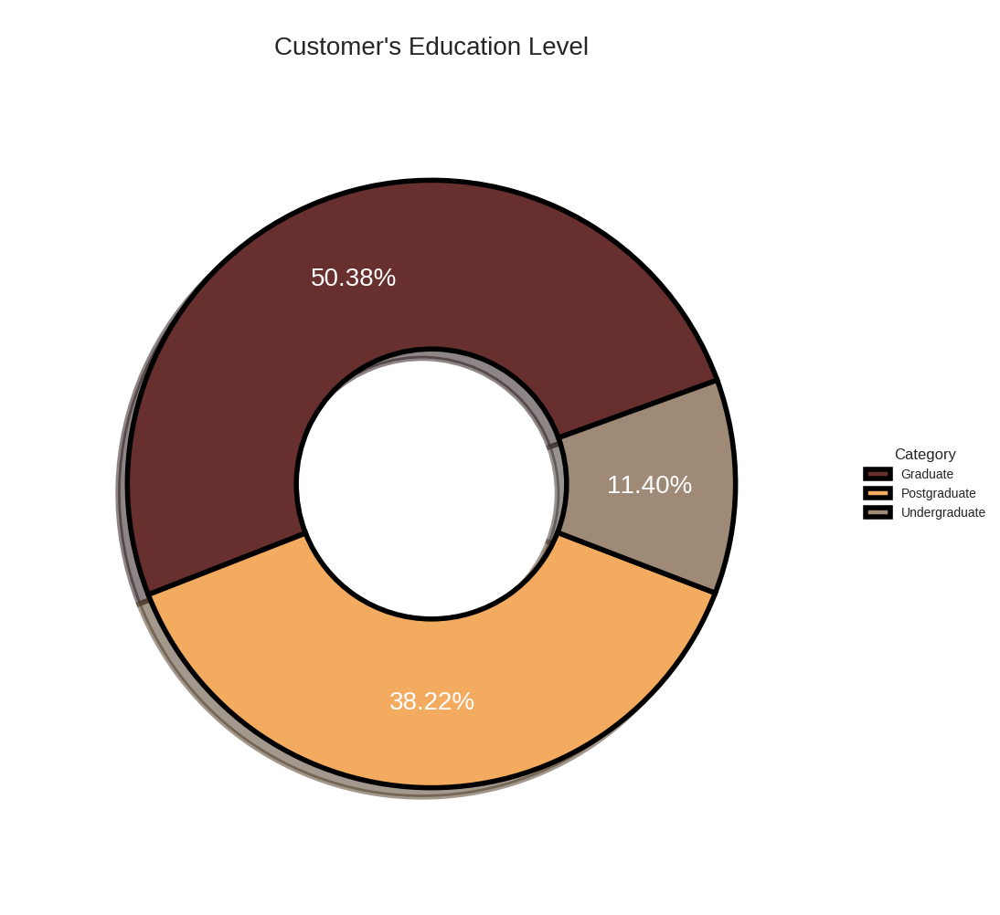

In [47]:
print(f"Let's have a look on the customer's education :")
plt.subplots(figsize=(12, 12))

labels = "Graduate","Postgraduate","Undergraduate"
size = 0.5

wedges, texts, autotexts = plt.pie([data["Education"].value_counts()[0],
                                    data["Education"].value_counts()[1],
                                    data["Education"].value_counts()[2]],
                                    explode = (0,0,0),
                                    textprops=dict(size= 20, color= "white"),
                                    autopct="%.2f%%",
                                    pctdistance = 0.72,
                                    radius=.9,
                                    colors = ["#682F2F","#F3AB60","#9F8A78"],
                                    shadow = True,
                                    wedgeprops=dict(width = size, edgecolor = "black",
                                    linewidth = 4),
                                    startangle = 20)

plt.legend(wedges, labels, title="Category",loc="center left",bbox_to_anchor=(1, 0, 0.5, 1), edgecolor = "black")
plt.title("\nCustomer's Education Level",fontsize=20)
plt.show()

Let's have a look on the distribution of customer's income and spending on basis of education level :


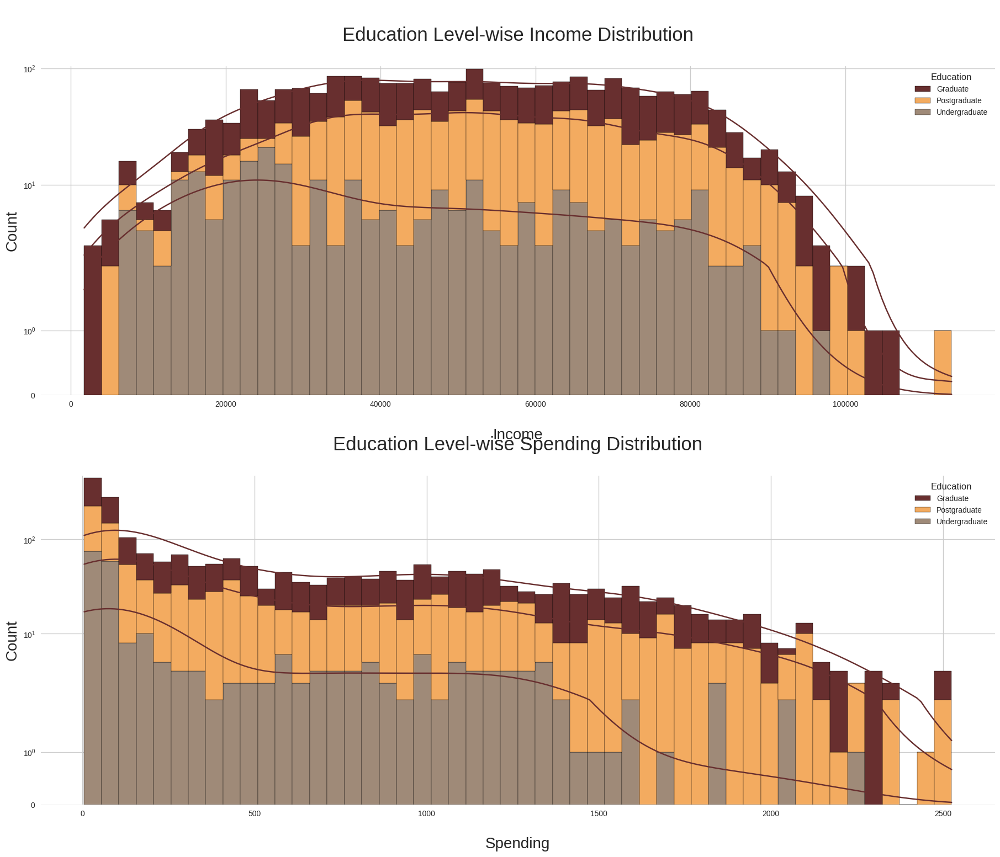

In [48]:
# Define the palette with colors for each education level
palette = ["#682F2F", "#F3AB60", "#9F8A78"]

print(f"Let's have a look on the distribution of customer's income and spending on basis of education level :")

_, axes = plt.subplots(2,1,figsize=(20,16),sharex=False)
plt.tight_layout(pad=7.0)

sns.histplot(data=data,x="Income",hue="Education",multiple="stack",palette=["#682F2F","#F3AB60","#9F8A78"],ax=axes[0],kde=True,bins=50,alpha=1,fill=True,edgecolor="black")
axes[0].lines[0].set_color(palette[0])
axes[0].lines[1].set_color(palette[0])
axes[0].lines[2].set_color(palette[0])
axes[0].set_yscale("symlog")
axes[0].set_title("\nEducation Level-wise Income Distribution\n",fontsize=25)
axes[0].set_ylabel("Count",fontsize=20)
axes[0].set_xlabel("\nIncome",fontsize=20)

sns.histplot(data=data,x="Spent",hue="Education",multiple="stack",palette=["#682F2F","#F3AB60","#9F8A78"],ax=axes[1],kde=True,bins=50,alpha=1,fill=True,edgecolor="black")
axes[1].lines[0].set_color(palette[0])
axes[1].lines[1].set_color(palette[0])
axes[1].lines[2].set_color(palette[0])
axes[1].set_yscale("symlog")
axes[1].set_title("\nEducation Level-wise Spending Distribution\n",fontsize=25)
axes[1].set_ylabel("Count",fontsize=20)
axes[1].set_xlabel("\nSpending",fontsize=20)

sns.despine(left=True, bottom=True)
plt.show()

Let's have a look on the distribution of customer's income and spending on basis of marital and parental status :


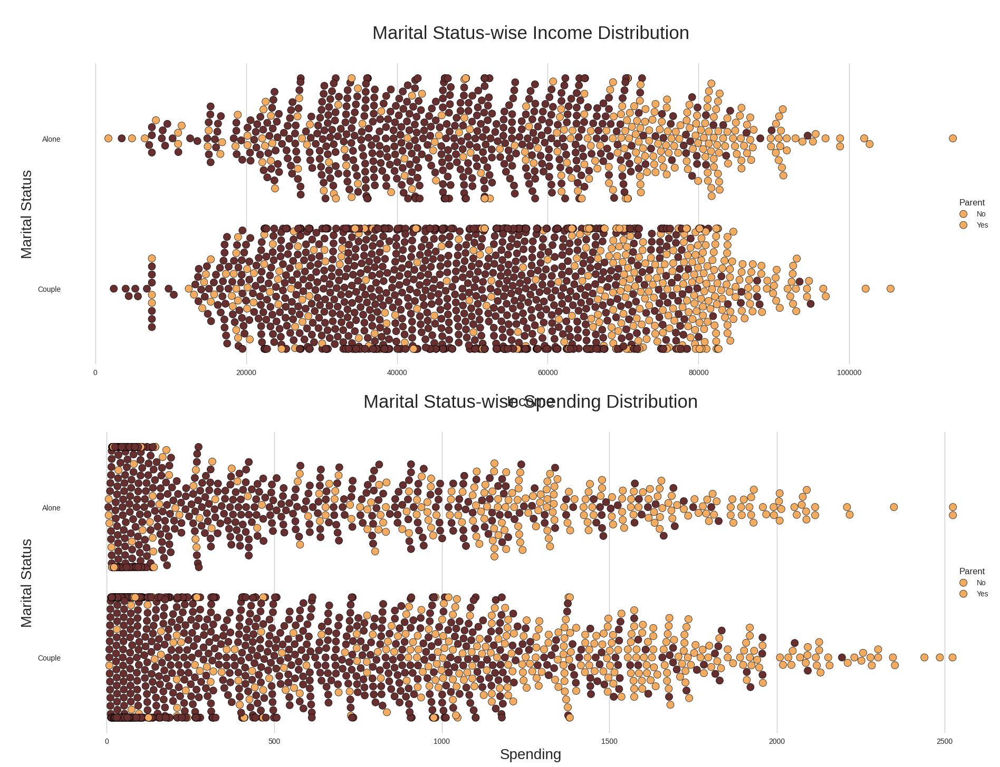

In [49]:
print(f"Let's have a look on the distribution of customer's income and spending on basis of marital and parental status :")

_, axes = plt.subplots(2,1,figsize=(20,15),sharex=False)
plt.tight_layout(pad=6.0)

sns.swarmplot(x=data["Income"],y=data["Marital Status"],hue=data["Parental Status"],palette=["#F3AB60","#682F2F"],ax=axes[0],marker="o",size=10,alpha=1,linewidth=0.5,edgecolor="black")
axes[0].legend(["No","Yes"],title="Parent", edgecolor = "#1c1c1c",loc="center right")
axes[0].set_title("\nMarital Status-wise Income Distribution\n",fontsize=25)
axes[0].set_xlabel("\nIncome",fontsize=20)
axes[0].set_ylabel("\nMarital Status",fontsize=20)

sns.swarmplot(x=data["Spent"],y=data["Marital Status"],hue=data["Parental Status"],palette=["#F3AB60","#682F2F"],ax=axes[1],marker="o",size=10,alpha=1,linewidth=0.5,edgecolor="black")
axes[1].legend(["No","Yes"],title="Parent", edgecolor = "#1c1c1c",loc="center right")
axes[1].set_title("\nMarital Status-wise Spending Distribution\n",fontsize=25)
axes[1].set_xlabel("Spending",fontsize=20)
axes[1].set_ylabel("\nMarital Status",fontsize=20)

sns.despine(left=True, bottom=True)
plt.show()

Let's have a look on the distribution of customer's children :


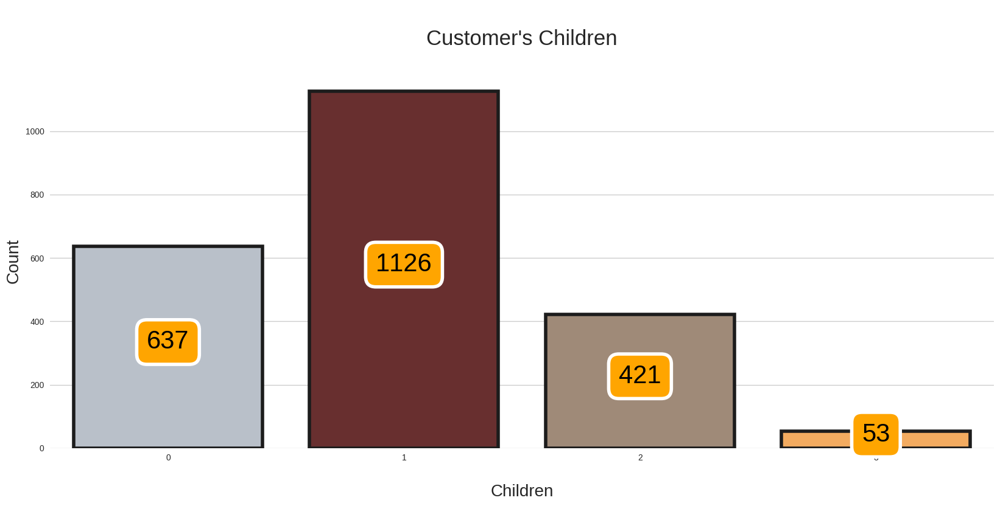

In [50]:
print(f"Let's have a look on the distribution of customer's children :")
plt.subplots(figsize=(20, 8))
p = sns.countplot(x=data["Children"],palette=["#B9C0C9","#682F2F", "#9F8A78","#F3AB60"], saturation=1,edgecolor = "#1c1c1c", linewidth = 4)
p.axes.set_yscale("linear")
p.axes.set_title("\nCustomer's Children\n",fontsize=25)
p.axes.set_ylabel("Count",fontsize=20)
p.axes.set_xlabel("\nChildren",fontsize=20)
p.axes.set_xticklabels(p.get_xticklabels(),rotation = 0)
for container in p.containers:
    p.bar_label(container,label_type="center",padding=6,size=30,color="black",rotation=0,
    bbox={"boxstyle": "round", "pad": 0.4, "facecolor": "orange", "edgecolor": "white", "linewidth" : 4, "alpha": 1})


sns.despine(left=True, bottom=True)
plt.show()

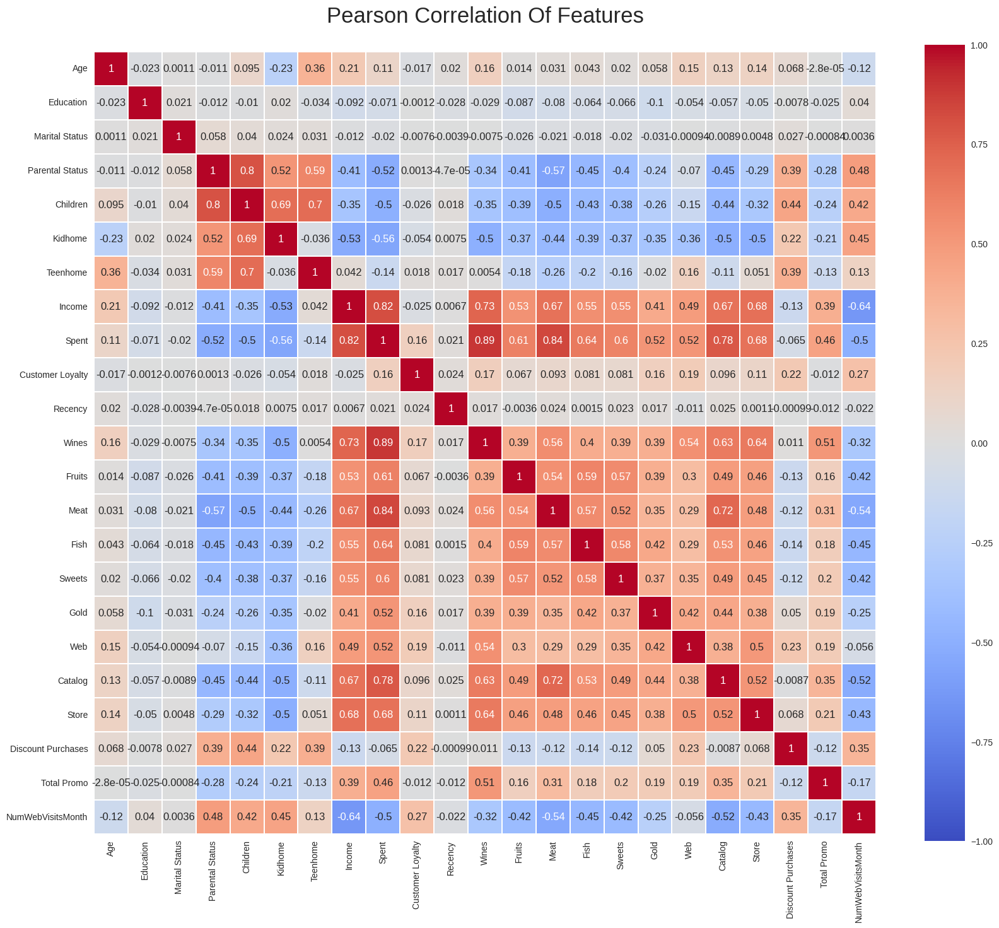

In [51]:
palette_cmap = 'coolwarm'
catcol = ["Education","Marital Status"]
le = LabelEncoder()
for col in catcol:
        data[col] = le.fit_transform(data[col])


plt.subplots(figsize =(20, 20))

sns.heatmap(data.drop(columns="ID").corr(), cmap = palette_cmap, square=True, cbar_kws=dict(shrink =.82),
            annot=True, vmin=-1, vmax=1, linewidths=0.1,linecolor='white',annot_kws=dict(fontsize =12))
plt.title("Pearson Correlation Of Features\n", fontsize=25)
plt.xticks(rotation=90)
plt.show()

In [52]:
dataC = data.copy()
scaler = StandardScaler()
dataC = scaler.fit_transform(dataC)
scaled_data = pd.DataFrame(dataC, columns= data.columns)
print("After scaling, let's have a glimpse of the scaled dataset :")
scaled_data.head().style.set_properties(**{"background-color": "#682F2F","color":"#e9c46a","border": "1.5px solid black"})

After scaling, let's have a glimpse of the scaled dataset :


,ID,Age,Education,Marital Status,Parental Status,Children,Kidhome,Teenhome,Income,Spent,Customer Loyalty,Recency,Wines,Fruits,Meat,Fish,Sweets,Gold,Web,Catalog,Store,Discount Purchases,Total Promo,NumWebVisitsMonth
0,-0.020567,1.017296,-0.894021,-1.348103,-1.584858,-1.264618,-0.825388,-0.930227,0.316918,1.680649,1.530038,0.307272,0.983671,1.554623,1.680253,2.461700,1.475877,0.846061,1.408080,2.510435,-0.552077,0.348371,-0.438816,0.692882
1,-1.053117,1.273722,-0.894021,-1.348103,0.630971,1.395420,1.032151,0.906417,-0.256728,-0.961838,-1.191484,-0.383584,-0.870717,-0.636422,-0.713250,-0.650275,-0.631440,-0.729569,-1.110957,-0.568802,-1.167421,-0.169096,-0.438816,-0.131574
2,-0.446841,0.333495,-0.894021,0.741783,-1.584858,-1.264618,-0.825388,-0.930227,0.972326,0.282956,-0.206788,-0.798098,0.362570,0.572430,-0.176928,1.345050,-0.147000,-0.037829,1.408080,-0.226664,1.293956,-0.686563,-0.438816,-0.543802
3,0.182245,-1.290534,-0.894021,0.741783,0.630971,0.065401,1.032151,-0.930227,-1.214815,-0.918627,-1.062830,-0.798098,-0.870717,-0.560868,-0.651196,-0.503829,-0.582996,-0.748784,-0.751094,-0.910939,-0.552077,-0.169096,-0.438816,0.280654
4,-0.082211,-1.034108,0.571125,0.741783,0.630971,0.065401,1.032151,-0.930227,0.324457,-0.305371,-0.953970,1.550812,-0.389289,0.421324,-0.216820,0.155177,-0.001667,-0.556634,0.328493,0.115473,0.063267,1.383304,-0.438816,-0.131574


In [53]:
scaled_dataC = scaled_data.copy()
pca = PCA(n_components = 3,random_state = 42)
scaled_dataC = pca.fit_transform(scaled_dataC)
pca_data = pd.DataFrame(scaled_dataC, columns=["col1","col2", "col3"])

print("Let's have a glimpse of the PCA transformed dataset :")
pca_data.head(15).style.set_properties(**{"background-color": "#682F2F","color":"#e9c46a","border": "1.5px solid black"})

Let's have a glimpse of the PCA transformed dataset :


,col1,col2,col3
0,4.562449,0.141060,2.057282
1,-2.856316,0.245852,-2.005189
2,2.439413,-0.838177,-0.236080
3,-2.694288,-1.535179,0.191763
4,-0.592913,-0.039958,0.456584
5,0.586285,1.249043,-0.782512
6,0.506356,1.582957,0.853055
7,-2.432765,-0.908040,1.505710
8,-3.002347,-1.226027,0.965088
9,-4.838198,0.589033,0.645775


Elbow Method for determining the number of clusters :


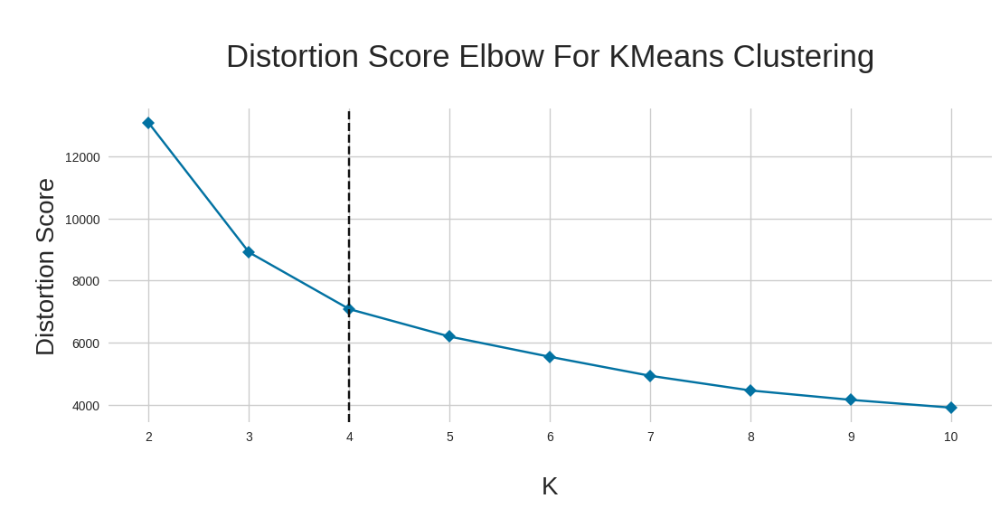

In [54]:
print("Elbow Method for determining the number of clusters :")
_, axes = plt.subplots(figsize=(20,8))

elbow = KElbowVisualizer(KMeans(), k=10, timings=False, locate_elbow=True, size=(1260,450))
elbow.fit(pca_data)

axes.set_title("\nDistortion Score Elbow For KMeans Clustering\n",fontsize=25)
axes.set_xlabel("\nK",fontsize=20)
axes.set_ylabel("\nDistortion Score",fontsize=20)

sns.despine(left=True, bottom=True)
plt.show()

In [55]:
km = KMeans(n_clusters = 4,random_state = 42)
# ac = AgglomerativeClustering(n_clusters=4)

y_km = km.fit_predict(pca_data)
pca_data["Clusters"] = y_km
data["Clusters"]= y_km

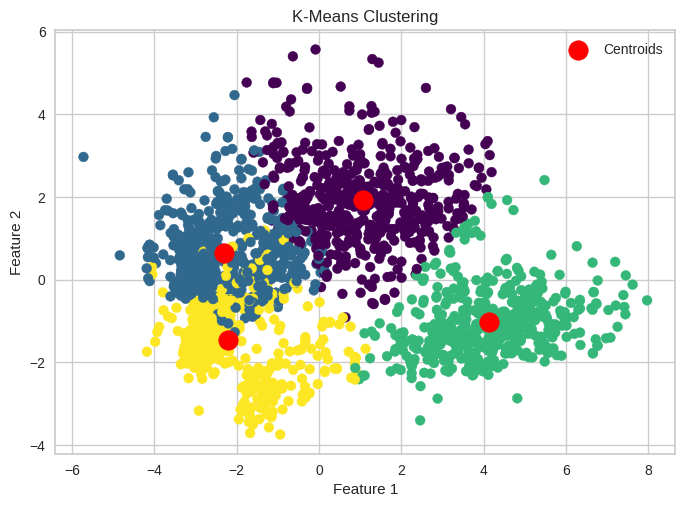

In [56]:
# Visualize K-Means clusters
plt.scatter(pca_data['col1'], pca_data['col2'], c=y_km, s=50, cmap='viridis')
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], s=200, c='red', label='Centroids')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.title('K-Means Clustering')
plt.legend()
plt.show()

Let's have a look on the customers quantity distribution after clustering :


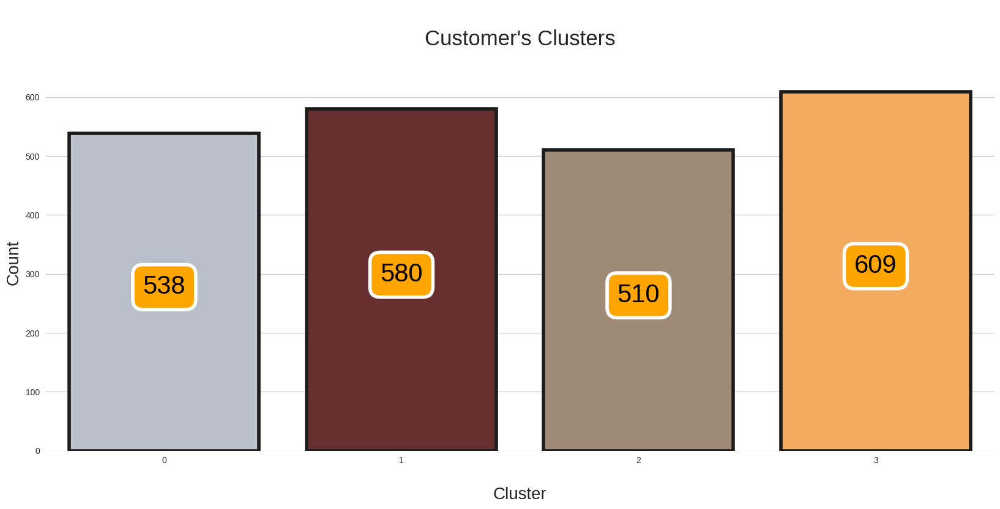

In [57]:
print("Let's have a look on the customers quantity distribution after clustering :")

plt.subplots(figsize=(20, 8))
p = sns.countplot(x=data["Clusters"],palette=["#B9C0C9","#682F2F", "#9F8A78","#F3AB60"], saturation=1,edgecolor = "#1c1c1c", linewidth = 4)
p.axes.set_yscale("linear")
p.axes.set_title("\nCustomer's Clusters\n",fontsize=25)
p.axes.set_ylabel("Count",fontsize=20)
p.axes.set_xlabel("\nCluster",fontsize=20)
p.axes.set_xticklabels(p.get_xticklabels(),rotation = 0)
for container in p.containers:
    p.bar_label(container,label_type="center",padding=6,size=30,color="black",rotation=0,
    bbox={"boxstyle": "round", "pad": 0.4, "facecolor": "orange", "edgecolor": "white", "linewidth" : 4, "alpha": 1})


sns.despine(left=True, bottom=True)
plt.show()

Let's have a look on the characteristics of the clusters on the basis of income and spending :


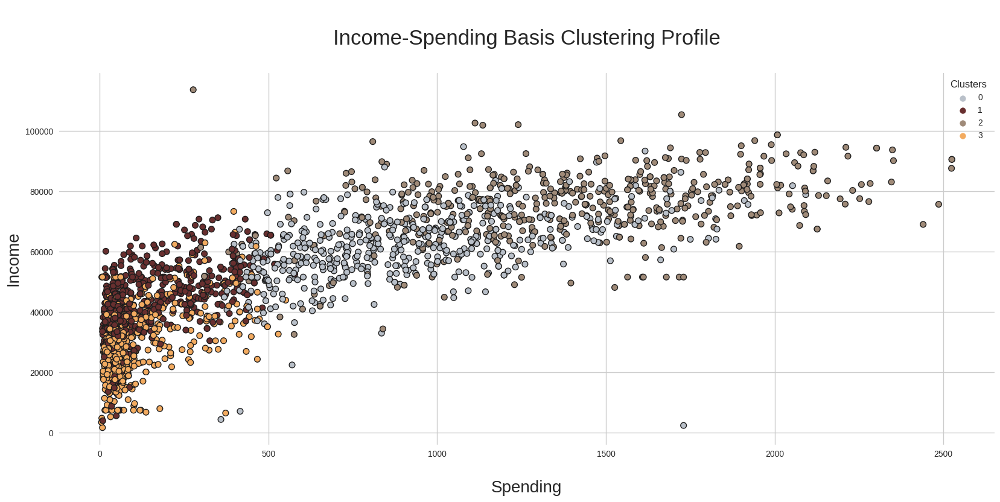

In [58]:
print(f"Let's have a look on the characteristics of the clusters on the basis of income and spending :")

_, axes = plt.subplots(figsize=(20,8))
sns.scatterplot(x=data["Spent"],y=data["Income"],hue=data["Clusters"],palette=["#B9C0C9","#682F2F", "#9F8A78","#F3AB60"],sizes=60, alpha=1,edgecolor = "#1c1c1c", linewidth = 1)
axes.set_title("\nIncome-Spending Basis Clustering Profile\n",fontsize=25)
axes.set_ylabel("Income",fontsize=20)
axes.set_xlabel("\nSpending",fontsize=20)

sns.despine(left=True, bottom=True)
plt.show()

Let's have a look on the characteristics of the clusters on the basis of spending :


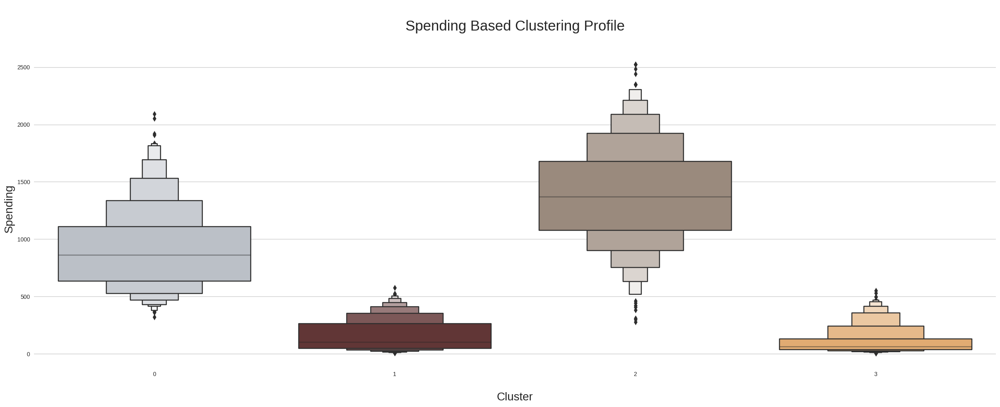

In [59]:
print(f"Let's have a look on the characteristics of the clusters on the basis of spending :")

_, axes = plt.subplots(figsize=(30,10))
sns.boxenplot(x=data["Clusters"], y=data["Spent"], palette=["#B9C0C9","#682F2F", "#9F8A78","#F3AB60"])
# sns.swarmplot(x=data["Clusters"],y=data["Spent"],color="#B9C0C9",marker="o",size=10,alpha=0.6,linewidth=0,edgecolor="white")

axes.set_title("\nSpending Based Clustering Profile\n",fontsize=25)
axes.set_ylabel("Spending",fontsize=20)
axes.set_xlabel("\nCluster",fontsize=20)

sns.despine(left=True, bottom=True)
plt.show()

Let's have a look on the characteristics of the clusters on the basis of accepting promotions :


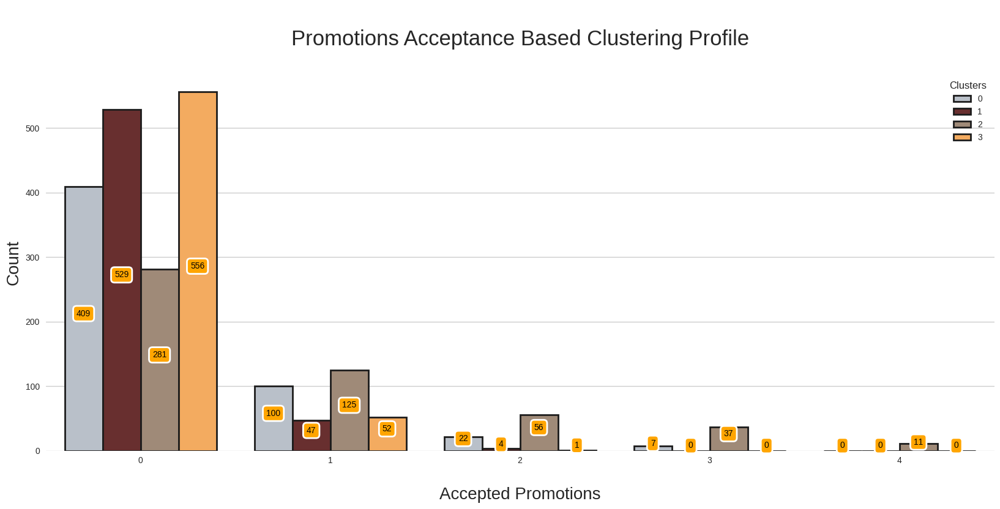

In [60]:
print(f"Let's have a look on the characteristics of the clusters on the basis of accepting promotions :")

plt.subplots(figsize=(20, 8))
p = sns.countplot(x=data["Total Promo"],hue=data["Clusters"],palette=["#B9C0C9","#682F2F", "#9F8A78","#F3AB60"], saturation=1,edgecolor = "#1c1c1c", linewidth = 2)
p.axes.set_yscale("linear")
p.axes.set_title("\nPromotions Acceptance Based Clustering Profile\n",fontsize=25)
p.axes.set_ylabel("Count",fontsize=20)
p.axes.set_xlabel("\nAccepted Promotions",fontsize=20)
p.axes.set_xticklabels(p.get_xticklabels(),rotation = 0)
for container in p.containers:
    p.bar_label(container,label_type="center",padding=6,size=10,color="black",rotation=0,
    bbox={"boxstyle": "round", "pad": 0.4, "facecolor": "orange", "edgecolor": "white", "linewidth" : 2, "alpha": 1})


sns.despine(left=True, bottom=True)
plt.show()

Let's have a look on the characteristics of the clusters on the basis of discount purchases :


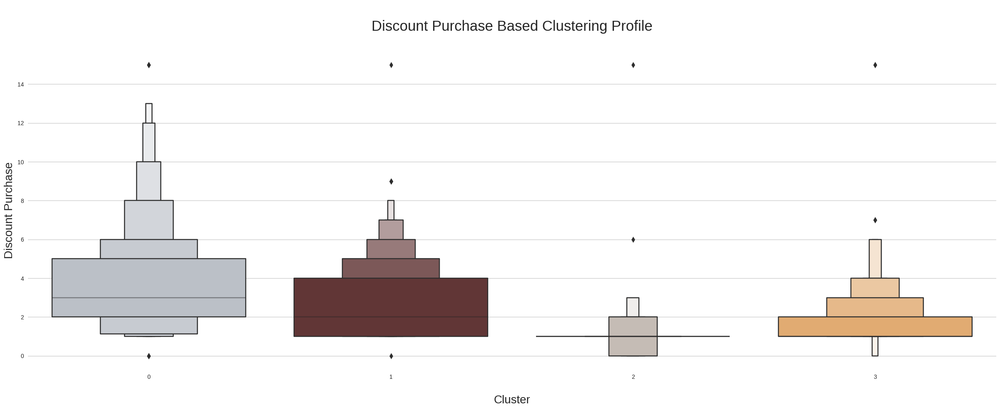

In [61]:
print(f"Let's have a look on the characteristics of the clusters on the basis of discount purchases :")

_, axes = plt.subplots(figsize=(30,10))
sns.boxenplot(x=data["Clusters"], y=data["Discount Purchases"], palette=["#B9C0C9","#682F2F", "#9F8A78","#F3AB60"])

axes.set_title("\nDiscount Purchase Based Clustering Profile\n",fontsize=25)
axes.set_ylabel("Discount Purchase",fontsize=20)
axes.set_xlabel("\nCluster",fontsize=20)

sns.despine(left=True, bottom=True)
plt.show()

In [62]:
def cluster(feature):

    _, axes = plt.subplots(figsize=(20,8))
    sns.kdeplot(x=data[feature], y=data["Spent"], hue =data["Clusters"], kind="kde",height=10, palette=["#B9C0C9","#682F2F", "#9F8A78","#F3AB60"])
    axes.set_title(f"\nClustering Profile On {feature}\n",fontsize=25)
    axes.set_ylabel("Spending",fontsize=20)
    axes.set_xlabel(f"\n{feature}",fontsize=20)

    sns.despine(left=True, bottom=True)
    plt.show()

Characteristics of clusters based on spending and having childern :


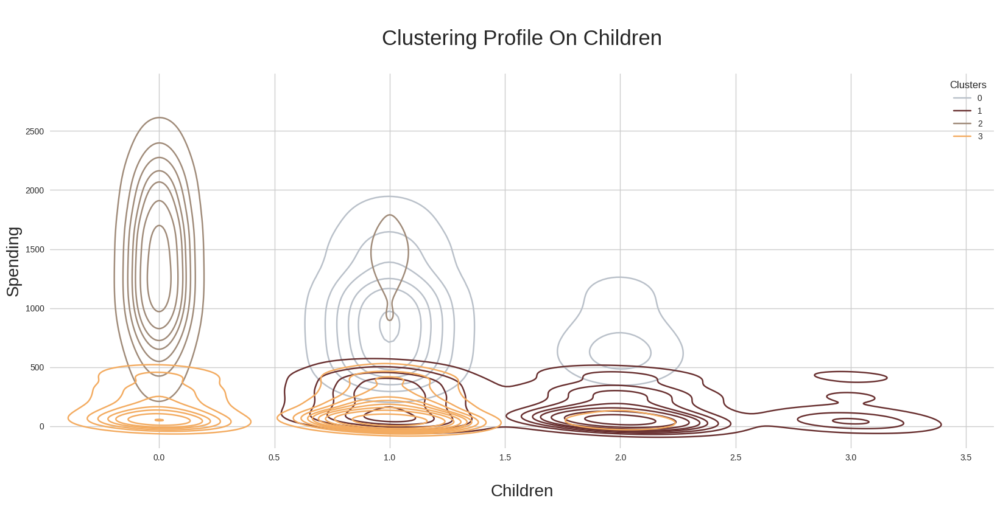

In [63]:
print(f"Characteristics of clusters based on spending and having childern :")
cluster("Children")

Characteristics of clusters based on spending and age :


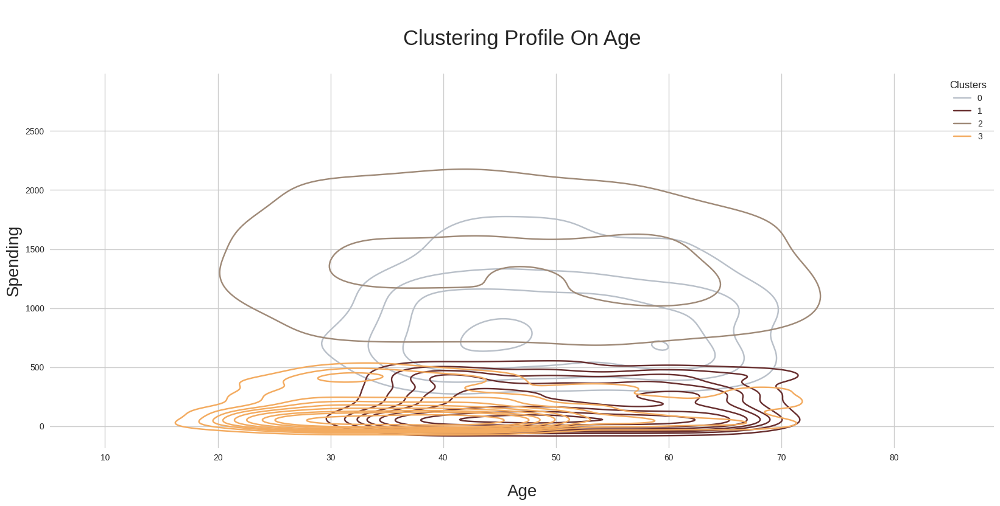

In [64]:
print(f"Characteristics of clusters based on spending and age :")
cluster("Age")

Characteristics of clusters based on spending and education level :


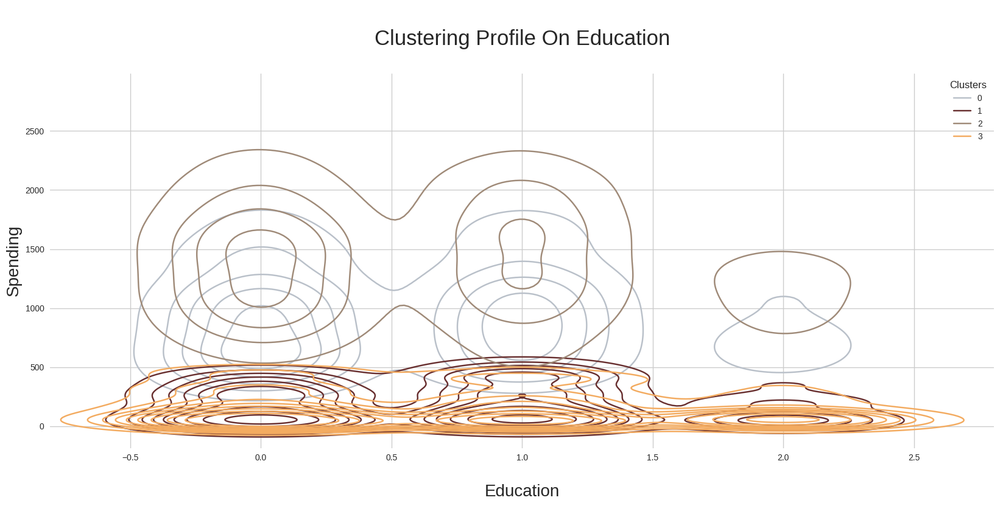

In [65]:
print(f"Characteristics of clusters based on spending and education level :")
cluster("Education")

Characteristics of clusters based on spending and marital status :


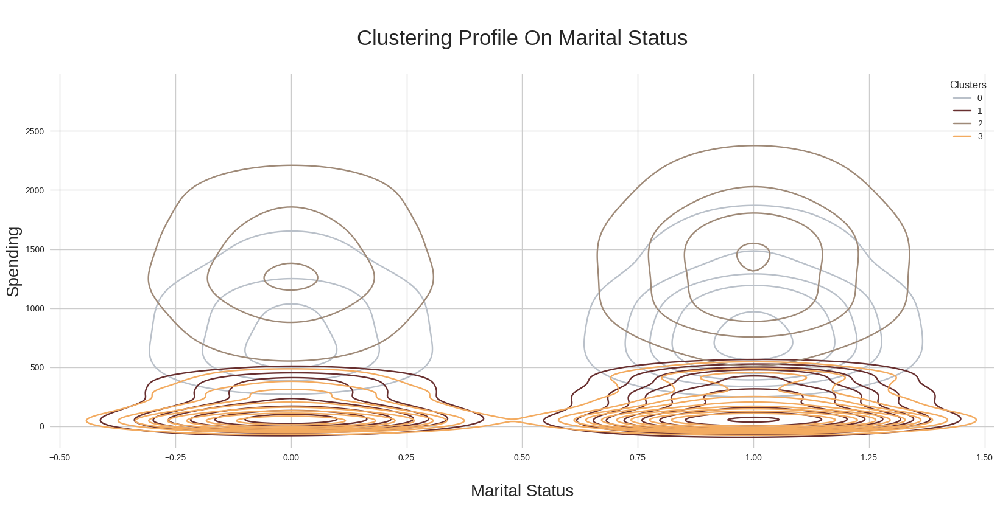

In [66]:
print(f"Characteristics of clusters based on spending and marital status :")
cluster("Marital Status")

Characteristics of clusters based on spending and parental status :


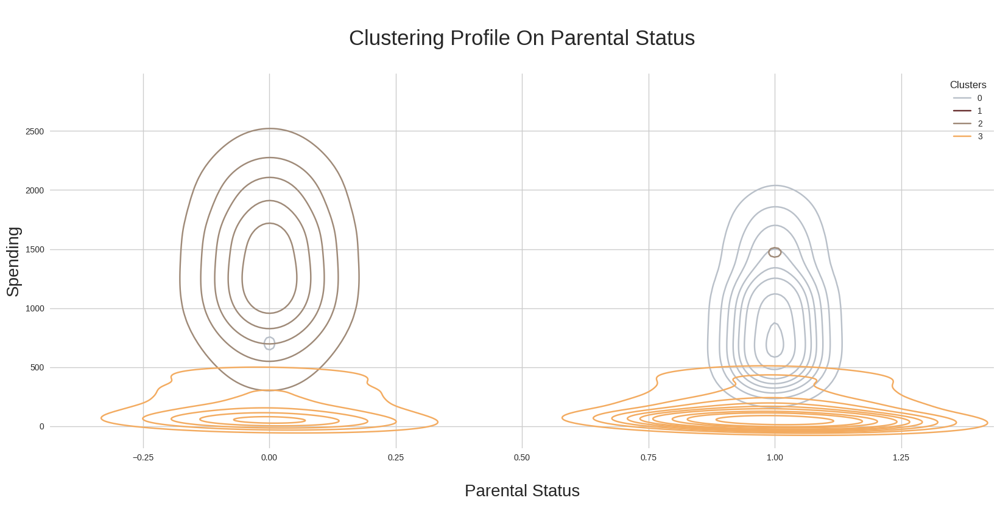

In [67]:
print(f"Characteristics of clusters based on spending and parental status :")
cluster("Parental Status")

Characteristics of clusters based on spending and customer loyalty :


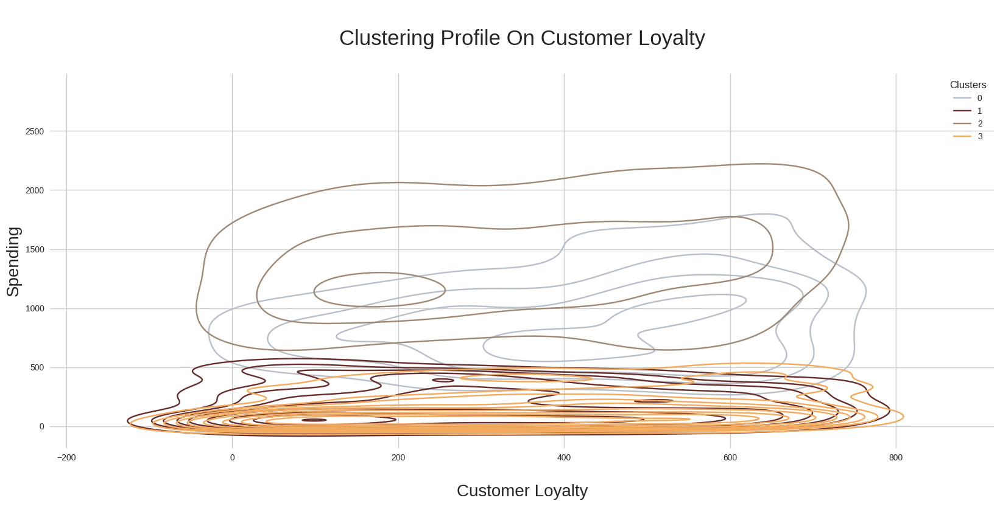

In [68]:
print(f"Characteristics of clusters based on spending and customer loyalty :")
cluster("Customer Loyalty")

## **Model Building**

In [69]:
# import required libraries
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn import metrics
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.model_selection import learning_curve


In [70]:
# separate features and target column
x = data.drop('Clusters', axis=1)
y = data["Clusters"]

In [71]:
# create train and test data
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size=0.3, random_state=42)

In [72]:
print(x_train.shape,x_test.shape, y_train.shape, y_test.shape)

(1565, 24) (672, 24) (1565,) (672,)


## **1) DECISION TREE**

In [73]:
# Build a Decision Tree classifier+++
decision_tree = DecisionTreeClassifier(random_state=42)
decision_tree.fit(x_train, y_train)


DecisionTreeClassifier(random_state=42)

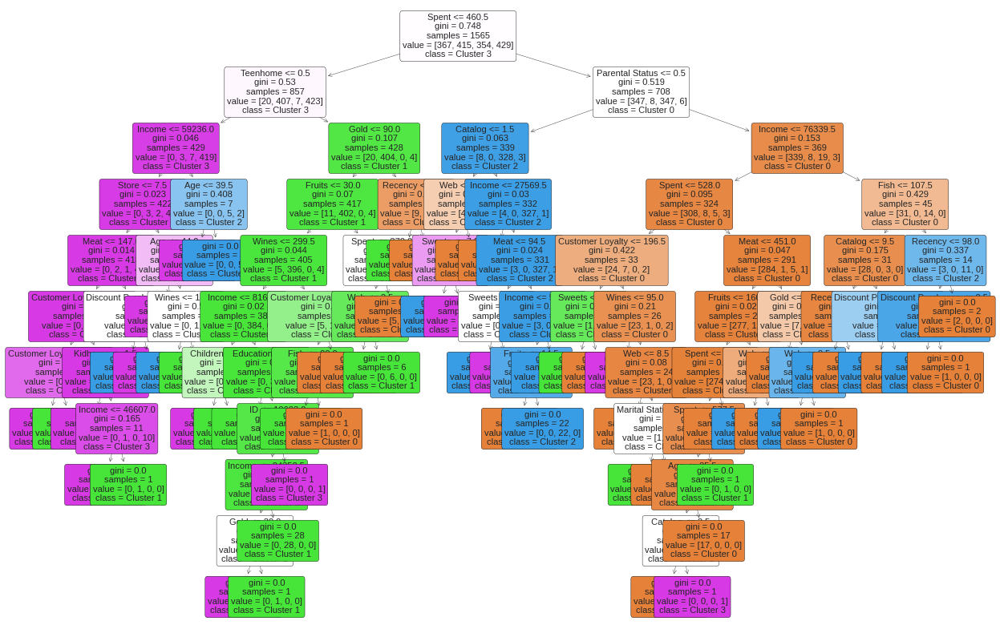

In [74]:
# Visualize the Decision Tree
class_names = ["Cluster 0", "Cluster 1", "Cluster 2", "Cluster 3"]


# Visualize the Decision Tree
plt.figure(figsize=(15, 10))
plot_tree(decision_tree, feature_names=x.columns, class_names=class_names, filled=True, rounded=True, fontsize=8)
plt.show()

In [75]:
# Predict on the test set
y_DT_pred = decision_tree.predict(x_test)

In [76]:
# Evaluate Decision Tree performance
accuracy = accuracy_score(y_test, y_DT_pred)
print(f"Decision Tree Accuracy: {accuracy:.2f}")

Decision Tree Accuracy: 0.94


In [77]:
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.ensemble import BaggingClassifier, AdaBoostClassifier
import matplotlib.pyplot as plt

In [78]:
! pip install scikit-plot

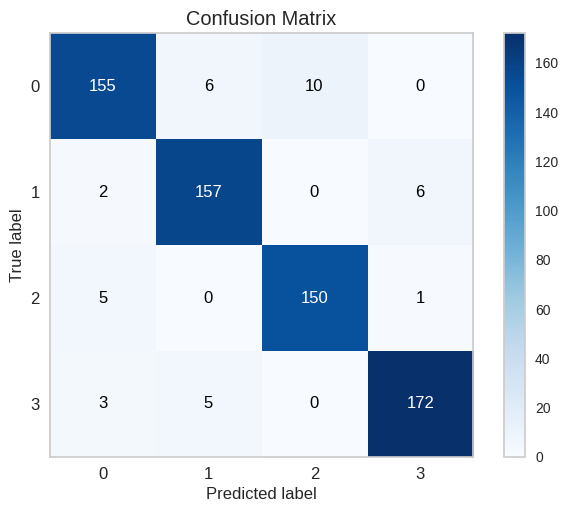

In [79]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test, y_DT_pred, normalize=False)
plt.show()

In [80]:
# Calculate Cohen's Kappa score
kappa_score = cohen_kappa_score(y_test, y_DT_pred)
# Print the Kappa score
print(f"Cohen's Kappa Score: {kappa_score:.2f}")

Cohen's Kappa Score: 0.92


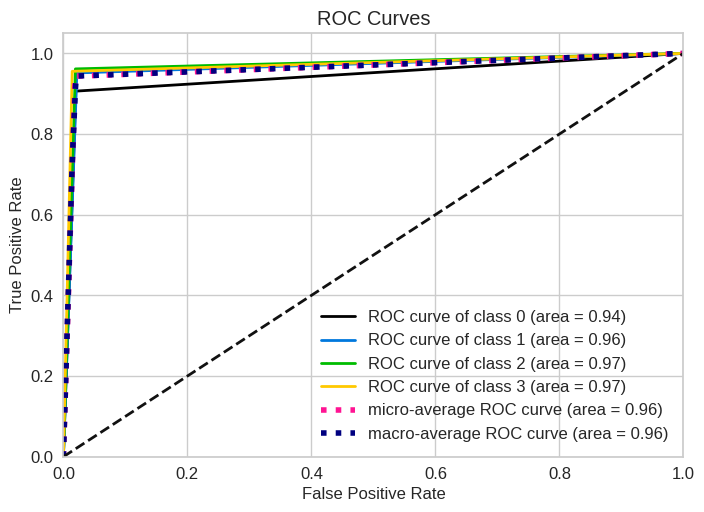

In [81]:
dtc_probas =decision_tree.predict_proba(x_test)
skplt.metrics.plot_roc(y_test, dtc_probas)
plt.show()

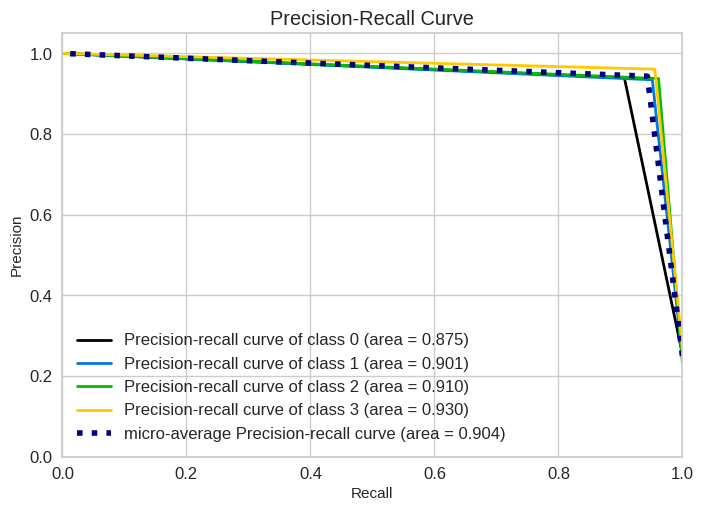

In [82]:
skplt.metrics.plot_precision_recall(y_test, dtc_probas)
plt.show()

In [83]:
print(" Decision Tree Classifier with Gini Impurity: ")
print(classification_report(y_test, y_DT_pred))
dtc_acc = metrics.accuracy_score(y_test,y_DT_pred)
dtc_prec = metrics.precision_score(y_test, y_DT_pred, average='macro')
dtc_rec = metrics.recall_score(y_test, y_DT_pred, average='macro')
dtc_f1 = metrics.f1_score(y_test, y_DT_pred,average='macro')
dtc_cm = metrics.confusion_matrix(y_test, y_DT_pred)
print('Confusion Matrix:\n', dtc_cm)

 Decision Tree Classifier with Gini Impurity: 
              precision    recall  f1-score   support

           0       0.94      0.91      0.92       171
           1       0.93      0.95      0.94       165
           2       0.94      0.96      0.95       156
           3       0.96      0.96      0.96       180

    accuracy                           0.94       672
   macro avg       0.94      0.94      0.94       672
weighted avg       0.94      0.94      0.94       672

Confusion Matrix:
 [[155   6  10   0]
 [  2 157   0   6]
 [  5   0 150   1]
 [  3   5   0 172]]


## **2) RANDOM FOREST CLASSIFIER**

In [84]:
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, GradientBoostingClassifier

In [85]:
# Random Forest Model
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(x_train, y_train)
y_rf_pred = rf_model.predict(x_test)

In [86]:
# Evaluate Random Forest Model
print("Random Forest Classifier:")
print("Accuracy:", accuracy_score(y_test, y_rf_pred))
print("Classification Report:\n", classification_report(y_test, y_rf_pred))

Random Forest Classifier:
Accuracy: 0.9672619047619048
Classification Report:
               precision    recall  f1-score   support

           0       0.95      0.95      0.95       171
           1       0.96      0.97      0.96       165
           2       0.97      0.97      0.97       156
           3       0.99      0.98      0.98       180

    accuracy                           0.97       672
   macro avg       0.97      0.97      0.97       672
weighted avg       0.97      0.97      0.97       672



In [87]:
# Get predicted probabilities
y_scores = rf_model.predict_proba(x_test)

In [88]:
# Binarize the labels for multiclass ROC and PR curves
y_test_bin = label_binarize(y_test, classes=range(y_test.nunique()))

In [89]:
# Initialize empty lists for ROC and PR AUC scores
roc_aucs = []
prc_aucs = []


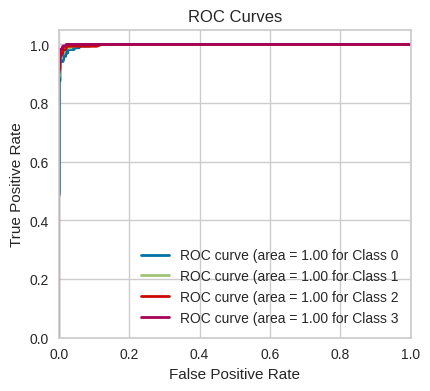

In [90]:
# Plot ROC curves for each class
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
for i in range(y_test.nunique()):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_scores[:, i])
    roc_auc = auc(fpr, tpr)
    roc_aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, label=f'ROC curve (area = {roc_auc:.2f} for Class {i}')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc="lower right")

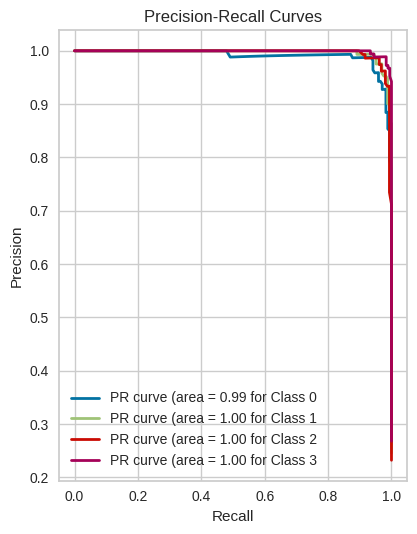

In [91]:
# Plot Precision-Recall curves for each class
plt.subplot(1, 2, 2)
for i in range(y_test.nunique()):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_scores[:, i])
    prc_auc = average_precision_score(y_test_bin[:, i], y_scores[:, i])
    prc_aucs.append(prc_auc)
    plt.plot(recall, precision, lw=2, label=f'PR curve (area = {prc_auc:.2f} for Class {i}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves')
plt.legend(loc="best")

plt.tight_layout()
plt.show()

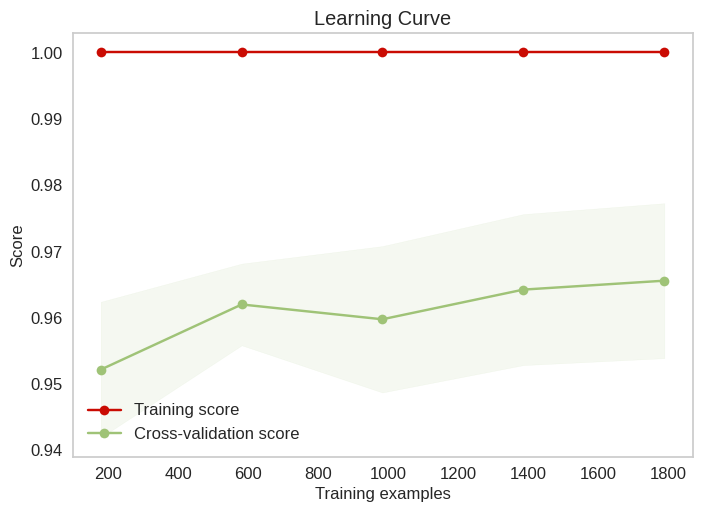

In [92]:
skplt.estimators.plot_learning_curve(rf_model, x, y)
plt.show()

In [93]:
print("Random Forest Classifier: ")
print(classification_report(y_test, y_rf_pred))
rfc_acc = metrics.accuracy_score(y_test,y_rf_pred)
rfc_prec = metrics.precision_score(y_test, y_rf_pred, average='macro')
rfc_rec = metrics.recall_score(y_test, y_rf_pred, average='macro')
rfc_f1 = metrics.f1_score(y_test, y_rf_pred,average='macro')
rfc_kappa = metrics.cohen_kappa_score(y_test,y_rf_pred)
print("Cohen_Kappa_Score =",rfc_kappa)
rfc_cm = metrics.confusion_matrix(y_test, y_rf_pred)
print('Confusion Matrix:\n', rfc_cm)

Random Forest Classifier: 
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       171
           1       0.96      0.97      0.96       165
           2       0.97      0.97      0.97       156
           3       0.99      0.98      0.98       180

    accuracy                           0.97       672
   macro avg       0.97      0.97      0.97       672
weighted avg       0.97      0.97      0.97       672

Cohen_Kappa_Score = 0.9563116694296935
Confusion Matrix:
 [[163   5   3   0]
 [  3 160   0   2]
 [  5   0 151   0]
 [  1   2   1 176]]


# **3) GRADIENT BOOSTING**

In [94]:
# Gradient Boosting
gb_model = GradientBoostingClassifier(random_state=42)
gb_model.fit(x_train, y_train)
y_pred_gb = gb_model.predict(x_test)

# Evaluate Gradient Boosting
print("Gradient Boosting:")
print("Accuracy:", accuracy_score(y_test, y_pred_gb))
print("Classification Report:\n", classification_report(y_test, y_pred_gb))
gbc_kappa = metrics.cohen_kappa_score(y_test,y_pred_gb)
print("Cohen_Kappa_Score =",gbc_kappa)
gbc_cm = metrics.confusion_matrix(y_test, y_pred_gb)
print('Confusion Matrix:\n', gbc_cm)

Gradient Boosting:
Accuracy: 0.9747023809523809
Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.96      0.96       171
           1       0.97      0.97      0.97       165
           2       0.98      0.97      0.98       156
           3       0.98      0.99      0.99       180

    accuracy                           0.97       672
   macro avg       0.97      0.97      0.97       672
weighted avg       0.97      0.97      0.97       672

Cohen_Kappa_Score = 0.9662369443015977
Confusion Matrix:
 [[165   2   3   1]
 [  3 160   0   2]
 [  3   1 152   0]
 [  0   2   0 178]]


In [95]:
# Get predicted probabilities
y_scores = gb_model.decision_function(x_test)

# Binarize the labels for multiclass ROC and PR curves
y_test_bin = label_binarize(y_test, classes=range(y_test.nunique()))

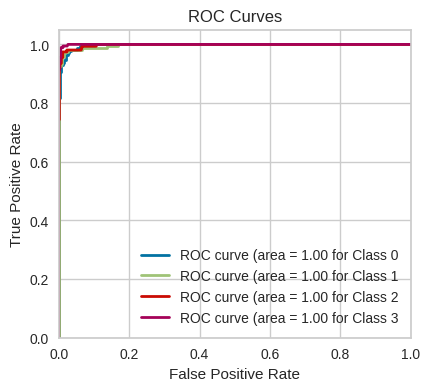

In [96]:
# Initialize empty lists for ROC and PR AUC scores
roc_aucs = []
prc_aucs = []

# Plot ROC curves for each class
plt.figure(figsize=(10, 4))
plt.subplot(1, 2, 1)
for i in range(y_test.nunique()):
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_scores[:, i])
    roc_auc = auc(fpr, tpr)
    roc_aucs.append(roc_auc)
    plt.plot(fpr, tpr, lw=2, label=f'ROC curve (area = {roc_auc:.2f} for Class {i}')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves')
plt.legend(loc="lower right")

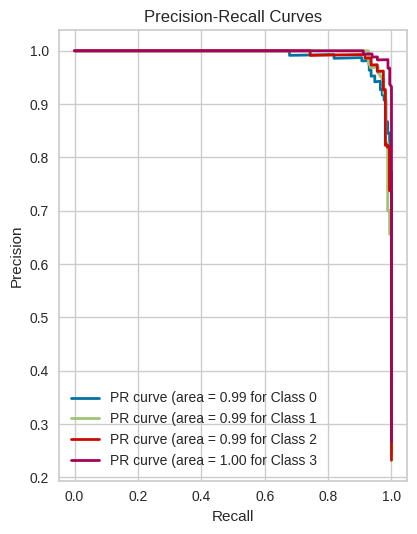

In [97]:
# Plot Precision-Recall curves for each class
plt.subplot(1, 2, 2)
for i in range(y_test.nunique()):
    precision, recall, _ = precision_recall_curve(y_test_bin[:, i], y_scores[:, i])
    prc_auc = average_precision_score(y_test_bin[:, i], y_scores[:, i])
    prc_aucs.append(prc_auc)
    plt.plot(recall, precision, lw=2, label=f'PR curve (area = {prc_auc:.2f} for Class {i}')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curves')
plt.legend(loc="best")

plt.tight_layout()
plt.show()

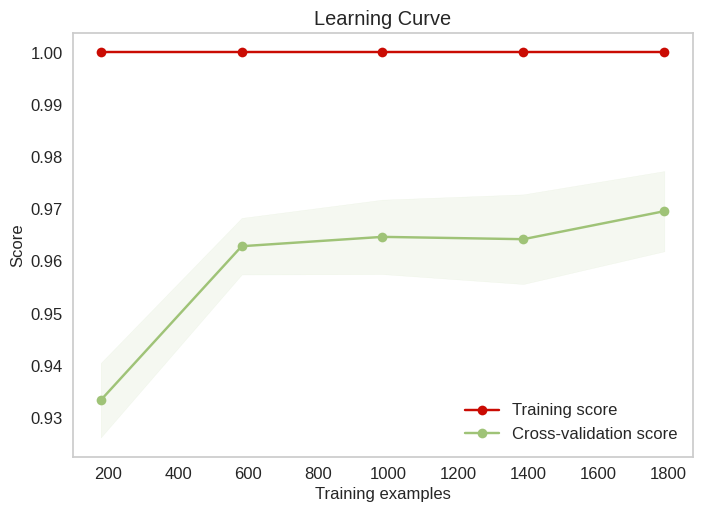

In [98]:
skplt.estimators.plot_learning_curve(gb_model, x, y)
plt.show()

## **4) NAIVE BAYER'S CLASSIFIER**

In [99]:
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB, BernoulliNB

In [100]:
# Create and train a Gaussian Naive Bayes model
nb_classifier = GaussianNB()
nb_classifier.fit(x_train, y_train)

GaussianNB()

In [101]:
# Make predictions on the test data
y_NB_pred = nb_classifier.predict(x_test)

In [102]:
# Evaluate the model
accuracy = accuracy_score(y_test, y_NB_pred)
classification_rep = classification_report(y_test, y_NB_pred)

In [103]:
# Create and train Bernoulli Naive Bayes for categorical features
bnb_classifier = BernoulliNB()
bnb_classifier.fit(x_train, y_train)

BernoulliNB()

In [104]:
# Make predictions using both classifiers
y_pred_gnb = nb_classifier.predict(x_test)
y_pred_bnb = nb_classifier.predict(x_test)

In [105]:
# Evaluate both models
accuracy_gnb = accuracy_score(y_test, y_pred_gnb)
classification_rep_gnb = classification_report(y_test, y_pred_gnb)

In [106]:
accuracy_bnb = accuracy_score(y_test, y_pred_bnb)
classification_rep_bnb = classification_report(y_test, y_pred_bnb)

In [107]:
print("Gaussian Naive Bayes:")
print("Accuracy:", accuracy_gnb)
print("Classification Report:\n", classification_rep_gnb)
gnb_kappa = metrics.cohen_kappa_score(y_test,y_pred_gnb)
print("Cohen_Kappa_Score =",gnb_kappa)
gnb_cm = metrics.confusion_matrix(y_test, y_pred_gnb)
print('Confusion Matrix:\n', gnb_cm)

Gaussian Naive Bayes:
Accuracy: 0.9047619047619048
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.91      0.88       171
           1       0.92      0.87      0.90       165
           2       0.92      0.96      0.94       156
           3       0.94      0.88      0.91       180

    accuracy                           0.90       672
   macro avg       0.91      0.91      0.91       672
weighted avg       0.91      0.90      0.90       672

Cohen_Kappa_Score = 0.8729483498174342
Confusion Matrix:
 [[156   2  13   0]
 [ 10 144   0  11]
 [  7   0 149   0]
 [ 11  10   0 159]]


In [108]:
print("\nBernoulli Naive Bayes:")
print("Accuracy:", accuracy_bnb)
print("Classification Report:\n", classification_rep_bnb)
bnb_kappa = metrics.cohen_kappa_score(y_test,y_pred_bnb)
print("Cohen_Kappa_Score =",bnb_kappa)
bnb_cm = metrics.confusion_matrix(y_test, y_pred_bnb)
print('Confusion Matrix:\n', bnb_cm)


Bernoulli Naive Bayes:
Accuracy: 0.9047619047619048
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.91      0.88       171
           1       0.92      0.87      0.90       165
           2       0.92      0.96      0.94       156
           3       0.94      0.88      0.91       180

    accuracy                           0.90       672
   macro avg       0.91      0.91      0.91       672
weighted avg       0.91      0.90      0.90       672

Cohen_Kappa_Score = 0.8729483498174342
Confusion Matrix:
 [[156   2  13   0]
 [ 10 144   0  11]
 [  7   0 149   0]
 [ 11  10   0 159]]


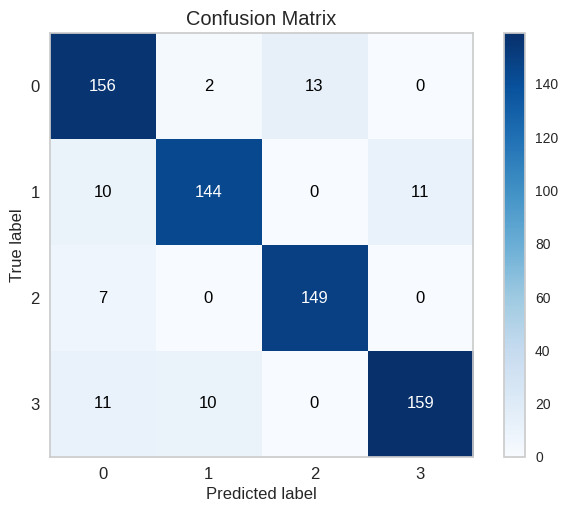

In [109]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test, y_pred_gnb, normalize=False)
plt.show()

In [111]:
gnb_probas =gnb.predict_proba(x_test)
skplt.metrics.plot_roc(y_test, gnb_probas)
plt.show()

NameError: ignored

In [ ]:
skplt.metrics.plot_precision_recall(y_test, gnb_probas)
plt.show()

In [ ]:
skplt.estimators.plot_learning_curve(nb_classifier, x, y)
plt.show()

## **5) KNN CLASSIFIER**

In [112]:
from sklearn.neighbors import KNeighborsClassifier

In [113]:
# Build the KNN model
k = 3  # You can choose an appropriate value of k
knn_model = KNeighborsClassifier(n_neighbors=k)
knn_model.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [115]:
# Make predictions on the test set
y_KNN_pred = knn_model.predict(x_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_KNN_pred)
print(f'Accuracy: {accuracy:.2f}')

# Print classification report and confusion matrix
print(classification_report(y_test, y_KNN_pred))
print(confusion_matrix(y_test, y_KNN_pred))

knn_kappa = metrics.cohen_kappa_score(y_test,y_KNN_pred)
print("Cohen_Kappa_Score =",knn_kappa)
knn_cm = metrics.confusion_matrix(y_test, y_KNN_pred)
print('Confusion Matrix:\n', knn_cm)

Accuracy: 0.65
              precision    recall  f1-score   support

           0       0.61      0.62      0.62       171
           1       0.55      0.53      0.54       165
           2       0.75      0.77      0.76       156
           3       0.70      0.71      0.70       180

    accuracy                           0.65       672
   macro avg       0.65      0.66      0.65       672
weighted avg       0.65      0.65      0.65       672

[[106  22  40   3]
 [ 27  87   1  50]
 [ 30   5 120   1]
 [ 10  43   0 127]]
Cohen_Kappa_Score = 0.539290780141844
Confusion Matrix:
 [[106  22  40   3]
 [ 27  87   1  50]
 [ 30   5 120   1]
 [ 10  43   0 127]]


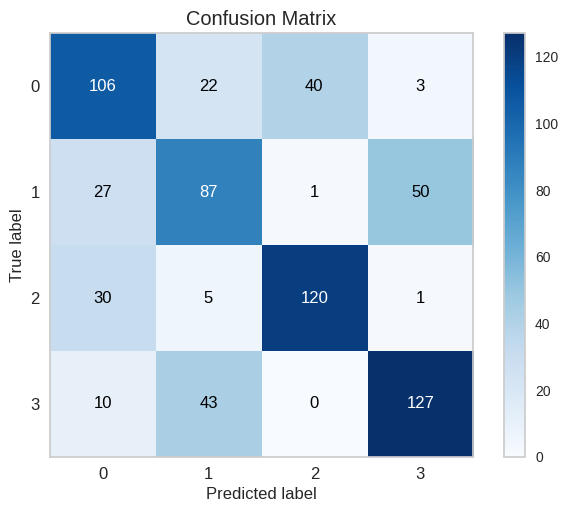

In [116]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test, y_KNN_pred, normalize=False)
plt.show()

In [117]:
knn_probas =knn.predict_proba(x_test)
skplt.metrics.plot_roc(y_test, knn_probas)
plt.show()

NameError: ignored

In [118]:
skplt.metrics.plot_precision_recall(y_test, knn_probas)
plt.show()

NameError: ignored

In [ ]:
skplt.estimators.plot_learning_curve(knn_model, x, y)
plt.show()

## **6) SUPPORT VECTOR MACHINE**

In [119]:
from sklearn import svm
from sklearn.svm import SVC

In [120]:
# Train SVM models with different kernels on the training dataset
kernels = ['linear', 'poly', 'rbf']
for kernel in kernels:
    svm = SVC(kernel=kernel)
    svm.fit(x_train, y_train)

    # Predict and evaluate the model on the test dataset
    y_SVM_pred = svm.predict(x_test)

    print(f"Kernel: {kernel}")
    print("Accuracy:", accuracy_score(y_test, y_SVM_pred))
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_SVM_pred))
    print("Classification Report:\n", classification_report(y_test, y_SVM_pred))

    svm_kappa = metrics.cohen_kappa_score(y_test,y_SVM_pred)
print("Cohen_Kappa_Score =",svm_kappa)
svm_cm = metrics.confusion_matrix(y_test,y_SVM_pred)
print('Confusion Matrix:\n', svm_cm)

Kernel: linear
Accuracy: 0.8630952380952381
Confusion Matrix:
 [[138   2  29   2]
 [  3 144   0  18]
 [ 12   0 144   0]
 [ 11  15   0 154]]
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.81      0.82       171
           1       0.89      0.87      0.88       165
           2       0.83      0.92      0.88       156
           3       0.89      0.86      0.87       180

    accuracy                           0.86       672
   macro avg       0.86      0.86      0.86       672
weighted avg       0.86      0.86      0.86       672

Kernel: poly
Accuracy: 0.6770833333333334
Confusion Matrix:
 [[109  30  31   1]
 [ 27  87   0  51]
 [ 36   7 112   1]
 [  3  30   0 147]]
Classification Report:
               precision    recall  f1-score   support

           0       0.62      0.64      0.63       171
           1       0.56      0.53      0.55       165
           2       0.78      0.72      0.75       156
           3       0.7

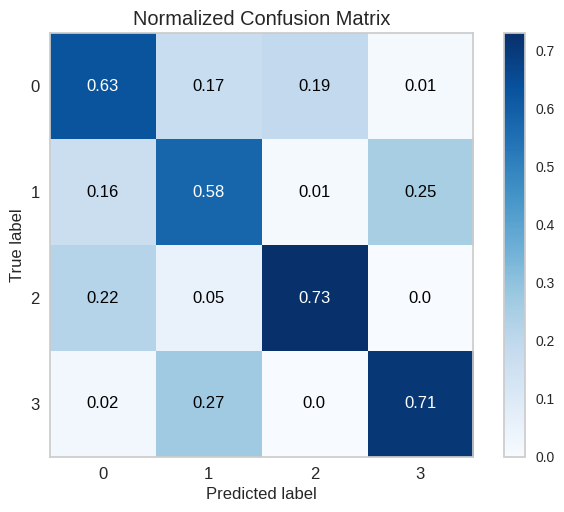

In [121]:
import scikitplot as skplt
skplt.metrics.plot_confusion_matrix(y_test, y_SVM_pred, normalize=True)
plt.show()

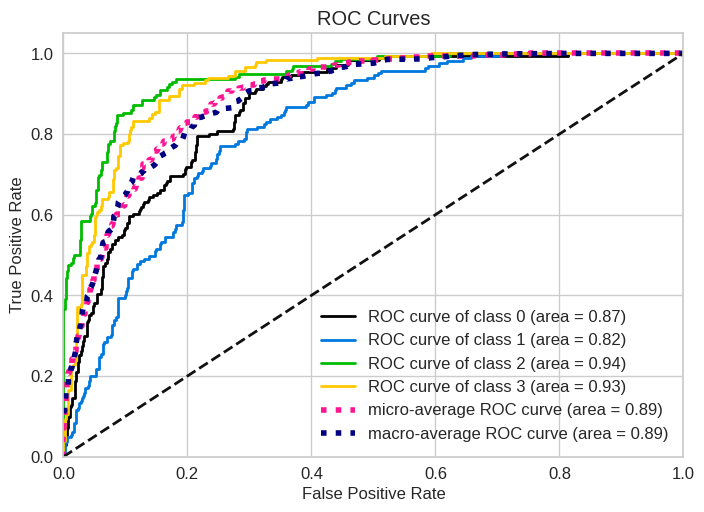

In [122]:
svmp= SVC(probability=True)
svmp.fit(x_train, y_train)
svmp_pred = svmp.predict(x_test)
svm_probas = svmp.predict_proba(x_test)
skplt.metrics.plot_roc(y_test, svm_probas)
plt.show()

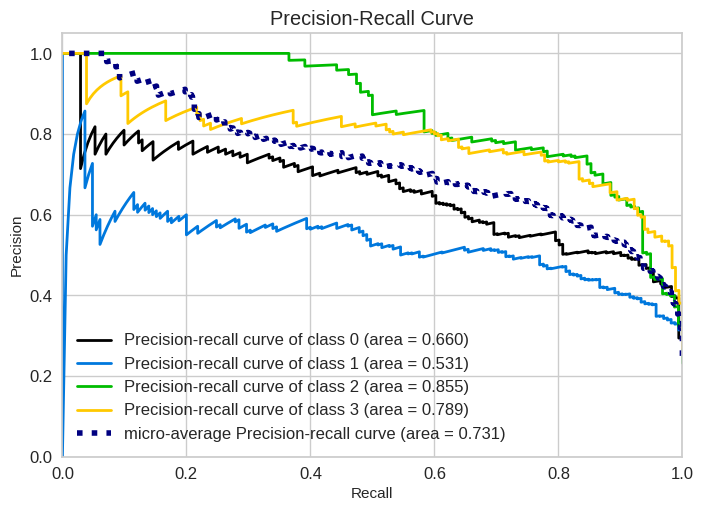

In [123]:
skplt.metrics.plot_precision_recall(y_test, svm_probas)
plt.show()

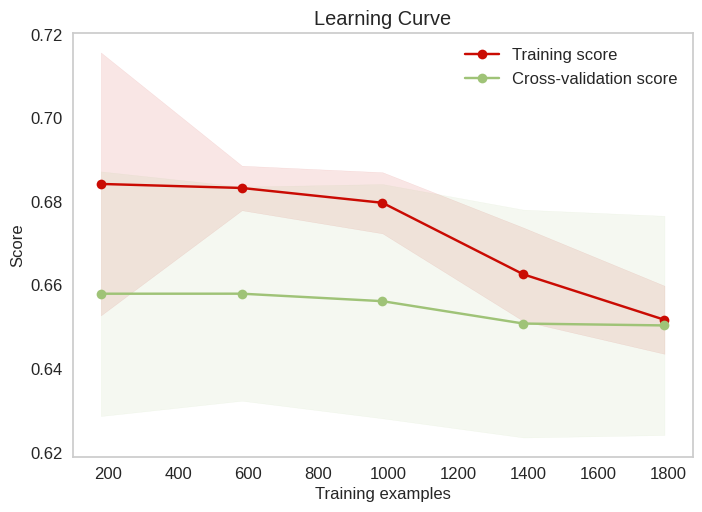

In [124]:
skplt.estimators.plot_learning_curve(svm, x, y)
plt.show()

In [125]:
# Define models
models = {
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'Naive Bayes': GaussianNB(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'SVM (Linear Kernel)': SVC(kernel='linear', random_state=42),
    'SVM (RBF Kernel)': SVC(kernel='rbf', random_state=42)
}

In [ ]:
# Evaluate models
for model_name, model in models.items():
    print(f"{model_name}:")
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)

    cm = confusion_matrix(y_test, y_pred)

    print("Confusion Matrix:")
    print(cm)
    print("Classification Report:")
    print(classification_report(y_test, y_pred))
    print('\n' + '='*50 + '\n')

Decision Tree:
Confusion Matrix:
[[155   6  10   0]
 [  2 157   0   6]
 [  5   0 150   1]
 [  3   5   0 172]]
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.91      0.92       171
           1       0.93      0.95      0.94       165
           2       0.94      0.96      0.95       156
           3       0.96      0.96      0.96       180

    accuracy                           0.94       672
   macro avg       0.94      0.94      0.94       672
weighted avg       0.94      0.94      0.94       672



Random Forest:
Confusion Matrix:
[[163   5   3   0]
 [  3 160   0   2]
 [  5   0 151   0]
 [  1   2   1 176]]
Classification Report:
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       171
           1       0.96      0.97      0.96       165
           2       0.97      0.97      0.97       156
           3       0.99      0.98      0.98       180

    accuracy             

In [ ]:
# Initialize lists to store evaluation metrics
accuracy_scores = []
precision_scores = []
recall_scores = []
f1_scores = []

In [ ]:
# Evaluate models and collect metrics
for model_name, model in models.items():
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)

    accuracy_scores.append(accuracy_score(y_test, y_pred))
    precision_scores.append(precision_score(y_test, y_pred, average='macro'))
    recall_scores.append(recall_score(y_test, y_pred, average='macro'))
    f1_scores.append(f1_score(y_test, y_pred, average='macro'))

([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, 'Decision Tree'),
  Text(1, 0, 'Random Forest'),
  Text(2, 0, 'Gradient Boosting'),
  Text(3, 0, 'Naive Bayes'),
  Text(4, 0, 'K-Nearest Neighbors'),
  Text(5, 0, 'SVM (Linear Kernel)'),
  Text(6, 0, 'SVM (RBF Kernel)')])

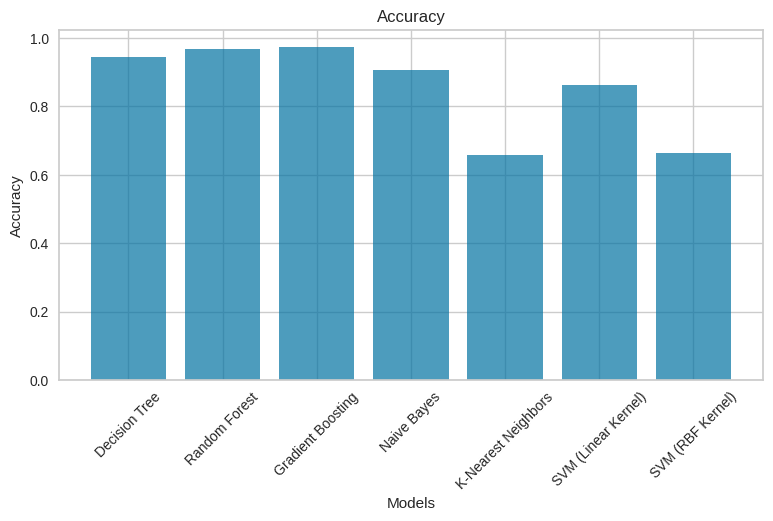

In [ ]:
# Create bar plots to compare metrics
plt.figure(figsize=(20, 10))

# Accuracy
plt.subplot(2, 2, 1)
plt.bar(models.keys(), accuracy_scores, color='b', alpha=0.7)
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy')
plt.xticks(rotation=45)

([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, 'Decision Tree'),
  Text(1, 0, 'Random Forest'),
  Text(2, 0, 'Gradient Boosting'),
  Text(3, 0, 'Naive Bayes'),
  Text(4, 0, 'K-Nearest Neighbors'),
  Text(5, 0, 'SVM (Linear Kernel)'),
  Text(6, 0, 'SVM (RBF Kernel)')])

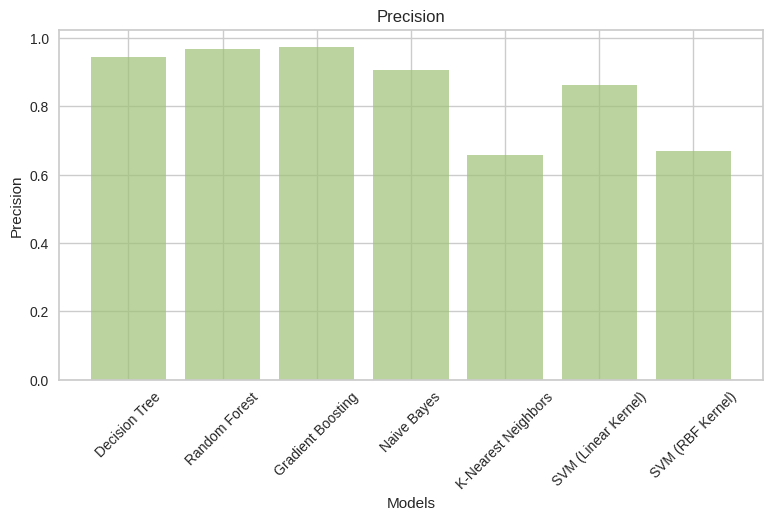

In [ ]:
# Create bar plots to compare metrics
plt.figure(figsize=(20, 10))

# Precision
plt.subplot(2, 2, 2)
plt.bar(models.keys(), precision_scores, color='g', alpha=0.7)
plt.xlabel('Models')
plt.ylabel('Precision')
plt.title('Precision')
plt.xticks(rotation=45)

([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, 'Decision Tree'),
  Text(1, 0, 'Random Forest'),
  Text(2, 0, 'Gradient Boosting'),
  Text(3, 0, 'Naive Bayes'),
  Text(4, 0, 'K-Nearest Neighbors'),
  Text(5, 0, 'SVM (Linear Kernel)'),
  Text(6, 0, 'SVM (RBF Kernel)')])

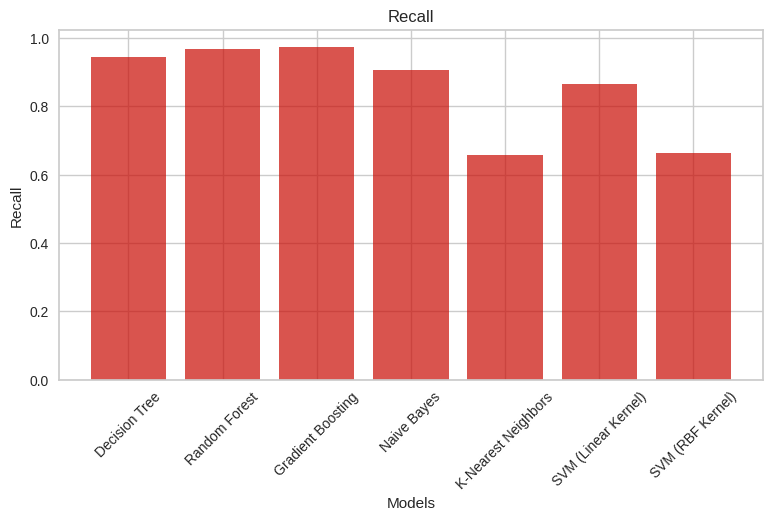

In [ ]:
# Create bar plots to compare metrics
plt.figure(figsize=(20, 10))

# Recall
plt.subplot(2, 2, 3)
plt.bar(models.keys(), recall_scores, color='r', alpha=0.7)
plt.xlabel('Models')
plt.ylabel('Recall')
plt.title('Recall')
plt.xticks(rotation=45)

([0, 1, 2, 3, 4, 5, 6],
 [Text(0, 0, 'Decision Tree'),
  Text(1, 0, 'Random Forest'),
  Text(2, 0, 'Gradient Boosting'),
  Text(3, 0, 'Naive Bayes'),
  Text(4, 0, 'K-Nearest Neighbors'),
  Text(5, 0, 'SVM (Linear Kernel)'),
  Text(6, 0, 'SVM (RBF Kernel)')])

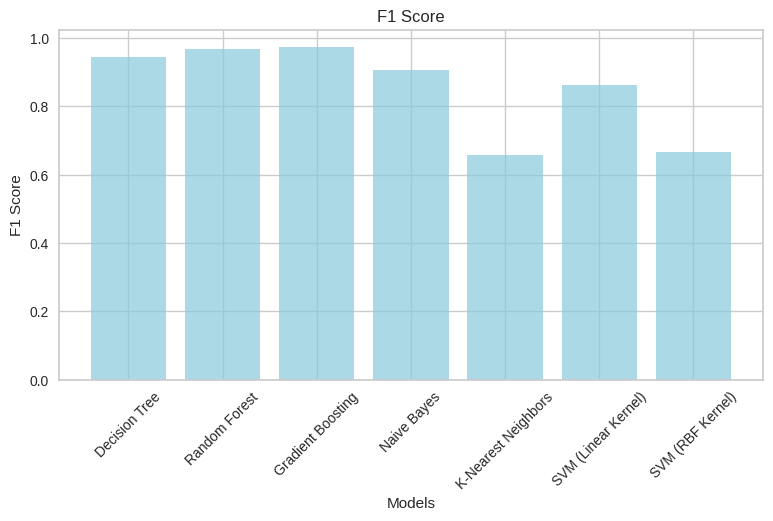

In [ ]:
# Create bar plots to compare metrics
plt.figure(figsize=(20, 10))

# F1 Score
plt.subplot(2, 2, 4)
plt.bar(models.keys(), f1_scores, color='c', alpha=0.7)
plt.xlabel('Models')
plt.ylabel('F1 Score')
plt.title('F1 Score')

plt.xticks(rotation=45)

In [ ]:
# saving the model
import pickle
pickle_out = open("classifier.pkl", mode = "wb")
pickle.dump(model, pickle_out)
pickle_out.close()